# Create SAR-derived runoff onset / snow pillow-derived runoff onset comparison dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import dask.dataframe as dd
import seaborn as sns
import xarray as xr
import geopandas as gpd
import coiled
import rasterio
import os
import xyzservices.providers as xyz
import matplotlib.cm as cm
import xyzservices as xyz
import easysnowdata
from global_snowmelt_runoff_onset.config import Config
import global_snowmelt_runoff_onset.processing as processing
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as ctx


In [2]:
from pathlib import Path

config = Config('config/global_config_v9.txt')

# Output is scoped by dataset version so a v10 run cannot overwrite the v9 dataset.
VERSION = config.version
SPATIAL_COMPARISON_NC = Path('comparison_datasets') / f'spatial_snotel_sar_differences_UPDATED_SNOTEL_LOCATIONS_andreq10cmSWEfor60days_{VERSION}.nc'

/home/eric/repos/global_snowmelt_runoff_onset/global_snowmelt_runoff_onset/config.py:299: UserWarning: Could not parse SAS token expiration date: SAS token is EXPIRED! Expired 21.3 hours ago on 2025-12-10 21:59 UTC
  warnings.warn(f"Could not parse SAS token expiration date: {e}")


----------------------------------------
Configuration loaded:
config_name = global_config_v9
version = v9
resolution = 0.00072000072000072
bands = vv
mountain_snow_only = False
spatial_chunk_dim_s1_read = 2048
spatial_chunk_dim_s1_process = 512
spatial_chunk_dim_zarr_output = 2048
bbox_left = -179.999
bbox_right = 179.999
bbox_top = 81.099
bbox_bottom = -59.999
wy_start = 2015
wy_end = 2024
low_backscatter_threshold = 0.001
min_monthly_acquisitions = 1
max_allowed_days_gap_per_orbit = 30
min_years_for_median_std = 3
extend_search_window_beyond_sdd_days = 16
min_consec_snow_days_for_seasonal_snow = 56
valid_tiles_geojson_path = processing/tile_data/global_tiles_with_seasonal_snow.geojson
tile_results_path = processing/tile_data/tile_results_v9.csv
global_runoff_zarr_store_azure_path = snowmelt/snowmelt_runoff_onset/global_v9.zarr
seasonal_snow_mask_zarr_store_azure_path = snowmelt/snow_cover/global_modis_snow_cover.zarr
seasonal_snow_mask_reproject_method = rasterio
-------------------

In [3]:
StationsWUS = easysnowdata.automatic_weather_stations.StationCollection()
StationsWUS.get_entire_data_archive()

Geodataframe with all stations has been added to the Station object. Please use the .all_stations attribute to access.
Use the .get_data(stations=geodataframe/string/list,variables=string/list,start_date=str,end_date=str) method to fetch data for specific stations and variables.
Decompressing data...
Creating xarray.Dataset from the uncompressed data...
Done! Entire archive dataset has been added to the station object. Please use the .entire_data_archive attribute to access.


In [4]:
stations_WUS_da = StationsWUS.entire_data_archive['WTEQ'].sel(time=slice('2014-10-01','2024-09-30'))
stations_WUS_da

<xarray.DataArray 'WTEQ' (station: 969, time: 3653)> Size: 28MB
array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(969, 3653))
Coordinates: (12/17)
  * time           (time) datetime64[ns] 29kB 2014-10-01 ... 2024-09-30
  * station        (station) <U12 47kB '1135_UT_SNTL' ... '915_ID_SNTL'
    name           (station) <U24 93kB 'Burts Miller Ranch' ... 'Schwartz Lake'
    network        (station) <U6 23kB 'SNOTEL' 'SNOTEL' ... 'SNOTEL' 'SNOTEL'
    elevation_m    (station) float64 8kB 2.438e+03 2.377e+03 ... 2.63e+03
    latitude       (station) float64 8kB 40.98 44.79 37.16 ... 40.28 42.3 44.85
    ...             ...
    beginDate      (station) datetime64[ns] 8kB 2009-10-01 ... 1995-09-26
    endDate        (station) datetime64[ns] 8kB 2025-12-10 ... 2025-12-10
    csvData        (station) bool 969B True True True True ... True True True
    geometry       (station) object 8kB POINT (-110.85075378417969 40.9849205...
    WY             (time) int64 29kB 2015 2015 2015 2015 ... 2024 2024 2024 2024
    DOWY           (time) int64 29kB 1 2 3 4 5 6 7 ... 361 362 363 364 365 366

In [5]:
stations_WUS_da = stations_WUS_da.where(stations_WUS_da>=0)

abs_diffs = np.abs(stations_WUS_da.diff(dim='time'))
abs_diffs_forward = abs_diffs.shift(time=1)
abs_diffs_backward = abs_diffs.shift(time=-1)
jump_mask = (abs_diffs_forward < 0.2) & (abs_diffs_backward < 0.2)
stations_WUS_da = stations_WUS_da.where(jump_mask)

window=10
valid_mask = ~np.isnan(stations_WUS_da)
rolling_valid = valid_mask.rolling(time=window*2, center=True).sum()
stations_WUS_da = stations_WUS_da.where(rolling_valid >= window)  


def check_missing_data(group):
    nov_to_apr_mask = group.time.dt.month.isin([11, 12, 1, 2, 3]) # not good!!!!! 
    filtered_group = group.where(nov_to_apr_mask,drop=True)
    missing_data_counts = filtered_group.isnull().sum(dim='time')

    missing_data = missing_data_counts > 30

    valid_data = ~np.isnan(group)

    def calc_location_gaps(location_data):
        valid_indices = ~np.isnan(location_data)
        if not np.any(valid_indices):
            return True
        valid_times = group.time.values[valid_indices]
        gaps = np.diff(valid_times)
        return np.any(gaps / np.timedelta64(1, 'D') > 10)
    
    large_gaps = xr.apply_ufunc(
        calc_location_gaps,
        group,
        input_core_dims=[['time']],
        vectorize=True,
        output_dtypes=[bool]
    )
    

    # Check for proper seasonal evolution
    if valid_data.any():
        first_valid_idx = valid_data.argmax(dim='time')
        last_valid_idx = valid_data[:, ::-1].argmax(dim='time')
        first_valid = group.isel(time=first_valid_idx)
        last_valid = group.isel(time=group.sizes['time'] - last_valid_idx - 1)
        improper_evolution = (first_valid > 0.1) | (last_valid > 0.1)
    else:
        improper_evolution = True


    columns_to_nan = missing_data | large_gaps | improper_evolution
    group[columns_to_nan] = np.nan
    return group

def check_seasonal_snow_swe(group):
    # Count days with SWE >= 0.05 in each window
    sufficient_swe = (group >= 0.1).rolling(time=60, center=True, min_periods=55).sum() #0.01 CHANGED TO 0.2, 20 CM!!!!!!!!!!!
    # Find locations that meet the criteria in any window
    columns_to_keep = (sufficient_swe >= 55).any(dim='time')
    # Mask out columns that don't meet criteria
    columns_to_nan = ~columns_to_keep
    group[columns_to_nan] = np.nan
    return group

def find_pct_max_timing(da, pct, dim='time', skipna=True):
    """Find the time when SWE last crosses below a percentage of max SWE"""
    max_val = da.max(dim=dim, skipna=skipna)
    threshold = max_val * pct
    # Create boolean mask of values above threshold
    above_thresh = xr.where(da >= threshold, 1, np.nan)
    # Find the last True value
    #return above_thresh.sel(time=slice(None, None, -1)).swap_dims({'time':'DOWY'}).idxmax(dim="DOWY", skipna=True).drop_vars('WY').where(lambda x: x>0) #reversed to get last max value instead of first
    return above_thresh.sel(time=slice(None, None, -1)).swap_dims({'time':'DOWY'}).idxmax(dim="DOWY", skipna=True).where(lambda x: x>0) #reversed to get last max value instead of first


stations_WUS_da = stations_WUS_da.groupby('WY').apply(check_missing_data)
stations_WUS_da = stations_WUS_da.groupby('WY').apply(check_seasonal_snow_swe)


#stations_WUS_max_SWE_timing_da = stations_WUS_da.fillna(-9999).groupby("WY").map(lambda x: x.sel(time=slice(None, None, -1)).idxmax("time",skipna=True).DOWY.drop_vars('WY')).where(lambda x: x>0) #reversed to get last max value instead of first
# stations_WUS_max_SWE_timing_da = stations_WUS_da.groupby("WY").map(lambda x: x.sel(time=slice(None, None, -1)).swap_dims({'time':'DOWY'}).idxmax("DOWY",skipna=True).drop_vars('WY')).where(lambda x: x>0)
stations_WUS_max_SWE_timing_da = stations_WUS_da.groupby("WY").map(lambda x: x.sel(time=slice(None, None, -1)).swap_dims({'time':'DOWY'}).idxmax("DOWY",skipna=True)).where(lambda x: x>0)

runoff_onset_max_swe_timing_WUS_ds = stations_WUS_max_SWE_timing_da.to_dataset(name='station_max_SWE_timing')

runoff_onset_max_swe_timing_WUS_ds["station_max_SWE_value"] = stations_WUS_da.groupby("WY").max()

pct_list = [0.99, 0.95, 0.9, 0.5]
for pct in pct_list:
    pct_str = str(int(pct * 100))
    runoff_onset_max_swe_timing_WUS_ds[f'station_max_SWE_{pct_str}pct_timing'] = stations_WUS_da.groupby("WY").map(lambda x: find_pct_max_timing(x, pct)).where(lambda x: x>0)

runoff_onset_max_swe_timing_WUS_ds

<xarray.Dataset> Size: 796kB
Dimensions:                       (station: 969, WY: 10)
Coordinates: (12/15)
  * station                       (station) <U12 47kB '1135_UT_SNTL' ... '915...
    name                          (station) <U24 93kB 'Burts Miller Ranch' .....
    network                       (station) <U6 23kB 'SNOTEL' ... 'SNOTEL'
    elevation_m                   (station) float64 8kB 2.438e+03 ... 2.63e+03
    latitude                      (station) float64 8kB 40.98 44.79 ... 44.85
    longitude                     (station) float64 8kB -110.9 -112.1 ... -113.8
    ...                            ...
    mountainRange                 (station) object 8kB None ... 'Idaho-Bitter...
    beginDate                     (station) datetime64[ns] 8kB 2009-10-01 ......
    endDate                       (station) datetime64[ns] 8kB 2025-12-10 ......
    csvData                       (station) bool 969B True True ... True True
    geometry                      (station) object 8kB POINT (-110.8507537841...
  * WY                            (WY) int64 80B 2015 2016 2017 ... 2023 2024
Data variables:
    station_max_SWE_timing        (station, WY) float64 78kB nan 186.0 ... 193.0
    station_max_SWE_value         (station, WY) float64 78kB nan ... 0.2769
    station_max_SWE_99pct_timing  (station, WY) float64 78kB nan 186.0 ... 194.0
    station_max_SWE_95pct_timing  (station, WY) float64 78kB nan 186.0 ... 196.0
    station_max_SWE_90pct_timing  (station, WY) float64 78kB nan 186.0 ... 197.0
    station_max_SWE_50pct_timing  (station, WY) float64 78kB nan 190.0 ... 226.0

In [6]:
# all_stations_gdf = StationsWUS.all_stations # old locations
all_stations_gdf = gpd.read_file('~/repos/updated_snotel_locations/snotel_stations_with_updated_locations.geojson').set_index('code') #new locations
all_stations_gdf

,name,network,elevation_m,latitude,longitude,state,HUC,mgrs,mountainRange,beginDate,endDate,csvData,coords_source,geometry
code,,,,,,,,,,,,,,
301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,41.235828,-120.791924,California,180200021403,10TFL,Great Basin Ranges,1983-10-01,2025-03-16,True,original,POINT (-120.79192 41.23583)
907_UT_SNTL,Agua Canyon,SNOTEL,2712.719971,37.522171,-112.271179,Utah,160300020301,12SUG,Colorado Plateau,1994-10-01,2025-03-16,True,updated_from_ally,POINT (-112.27138 37.5223)
916_MT_SNTL,Albro Lake,SNOTEL,2529.840088,45.597229,-111.959023,Montana,100200050701,12TVR,Central Montana Rocky Mountains,1996-09-01,2025-03-16,True,original,POINT (-111.95902 45.59723)
1267_AK_SNTL,Alexander Lake,SNOTEL,48.768002,61.749668,-150.889664,Alaska,190205051106,05VPJ,None,2014-08-28,2025-03-16,True,original,POINT (-150.88966 61.74967)
908_WA_SNTL,Alpine Meadows,SNOTEL,1066.800049,47.779572,-121.698471,Washington,171100100501,10TET,Cascade Range,1994-09-01,2025-03-16,True,original,POINT (-121.69847 47.77957)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SLT,Slate Creek,CCSS,1737.360000,41.043980,-122.480103,California,180200050304,10TEL,Klamath Mountains,2004-10-01,2025-03-16,True,original,POINT (-122.4801 41.04398)
SLI,Slide Canyon,CCSS,2804.160000,38.091234,-119.431881,California,180400090501,11SKC,Sierra Nevada,2005-10-01,2025-03-16,True,original,POINT (-119.43188 38.09123)
SLK,South Lake,CCSS,2926.080000,37.175903,-118.562660,California,180901020601,11SLB,Sierra Nevada,2004-10-01,2025-03-16,True,original,POINT (-118.56266 37.1759)


In [7]:
def get_station_gdf(all_stations_gdf, station_code, buffer_radius=None):

    station_gdf = all_stations_gdf[all_stations_gdf.index==station_code]

    station_epsg = station_gdf.estimate_utm_crs().to_epsg()

    station_gdf = station_gdf.to_crs(epsg=station_epsg)

    if buffer_radius:
        station_gdf['geometry'] = station_gdf.geometry.buffer(buffer_radius)

    return station_gdf


def get_station_buffered_runoff_onset(station_gdf):

    runoff_onset_WUS_ds = config.open_runoff_onset_dataset()

    runoff_onset_station_ds = runoff_onset_WUS_ds.rio.clip_box(*station_gdf.total_bounds, crs=station_gdf.crs).rio.reproject(station_gdf.crs)
    

    fcf_da = easysnowdata.remote_sensing.get_forest_cover_fraction(runoff_onset_station_ds.rio.transform_bounds('EPSG:4326'),mask_nodata=True).rio.reproject_match(runoff_onset_station_ds,resampling=rasterio.enums.Resampling.bilinear)
    runoff_onset_station_ds['fcf'] = fcf_da

    dem_da = easysnowdata.topography.get_copernicus_dem(runoff_onset_station_ds.rio.transform_bounds('EPSG:4326'), resolution=30).rio.reproject_match(runoff_onset_station_ds,resampling=rasterio.enums.Resampling.bilinear)
    runoff_onset_station_ds['dem'] = dem_da

    esa_da =easysnowdata.remote_sensing.get_esa_worldcover(runoff_onset_station_ds.rio.transform_bounds('EPSG:4326'),mask_nodata=True).rio.reproject_match(runoff_onset_station_ds,resampling=rasterio.enums.Resampling.mode)
    runoff_onset_station_ds['worldcover'] = esa_da

    runoff_onset_station_ds = runoff_onset_station_ds.rio.clip(station_gdf.geometry) 

    #runoff_onset_station_ds = runoff_onset_station_ds.rio.clip(station_gdf.geometry,all_touched=True) 

    return runoff_onset_station_ds

In [8]:
# station_code = "679_WA_SNTL"
# station_code = "SLT"
# station_gdf = get_station_gdf(station_code, buffer_radius=1000)
# station_gdf

In [9]:
# station_runoff_onset_ds = get_station_buffered_runoff_onset(station_gdf)
# station_runoff_onset_ds

### Create Spatially Explicit Comparison Dataset

Create a dataset with standardized spatial coordinates around each station for detailed spatial analysis.
Uses relative coordinates (pixel offsets from station center) to avoid coordinate explosion.

In [ ]:
# Cluster setup for spatial processing
cluster = coiled.Cluster(
    idle_timeout="10 minutes",
    n_workers=10,
    worker_memory="8 GB",
    worker_cpu=4,
    scheduler_memory="16 GB",
    spot_policy="spot",
    environ={"GDAL_DISABLE_READDIR_ON_OPEN": "EMPTY_DIR"},
    workspace="uwtacolab",
)

client = cluster.get_client()

In [ ]:
client.restart()

In [ ]:
def process_station_spatial(all_stations_gdf, station_code, buffer_radius=1000):
    """Process a single station and return spatially explicit results with integer coordinates centered at (0,0)"""
    # Get station geometry with fixed buffer
    station_gdf = get_station_gdf(all_stations_gdf, station_code, buffer_radius)
    
    # Get the full spatial dataset for this station
    runoff_onset_station_ds = get_station_buffered_runoff_onset(station_gdf)
    
    # Get station center coordinates
    station_center = station_gdf.geometry.centroid.iloc[0]
    center_x, center_y = station_center.x, station_center.y
    
    # Get grid dimensions
    x_size = runoff_onset_station_ds.sizes['x']
    y_size = runoff_onset_station_ds.sizes['y']
    
    # Create integer coordinates centered at (0,0)
    x_rel_int = np.arange(x_size) - x_size // 2
    y_rel_int = np.arange(y_size) - y_size // 2
    
    # Create the spatial dataset with integer coordinates
    spatial_ds = xr.Dataset()

    
    # Static spatial variables [y, x] - no masking applied
    spatial_ds['worldcover'] = runoff_onset_station_ds['worldcover'].rename({'x': 'x_rel', 'y': 'y_rel'})
    spatial_ds['fcf'] = runoff_onset_station_ds['fcf'].rename({'x': 'x_rel', 'y': 'y_rel'})
    spatial_ds['dem'] = runoff_onset_station_ds['dem'].rename({'x': 'x_rel', 'y': 'y_rel'})

    spatial_ds['radius'] = (np.sqrt((runoff_onset_station_ds.x - center_x)**2 + (runoff_onset_station_ds.y - center_y)**2)).rename({'x': 'x_rel', 'y': 'y_rel'})

    # Spatiotemporal variables [WY, y, x] - no masking applied
    spatial_ds['runoff_onset'] = runoff_onset_station_ds['runoff_onset'].rename({'water_year': 'WY', 'x': 'x_rel', 'y': 'y_rel'})
    spatial_ds['temporal_resolution'] = runoff_onset_station_ds['temporal_resolution'].rename({'water_year': 'WY', 'x': 'x_rel', 'y': 'y_rel'})
    

        # Assign new coordinate system (relative integer coordinates)
    spatial_ds = spatial_ds.assign_coords({
        'x_rel': ('x_rel', x_rel_int),
        'y_rel': ('y_rel', y_rel_int),
        'station': station_code
    })


    return spatial_ds
        

In [ ]:
# station_code = "679_WA_SNTL" 
# spatial_ds = process_station_spatial(all_stations_gdf, station_code)
# spatial_ds

client.restart()

In [ ]:
station_codes = runoff_onset_max_swe_timing_WUS_ds.station.values.tolist()
print(f"Processing {len(station_codes)} stations for spatially explicit dataset...")

In [ ]:
# Submit spatial processing tasks
futures = [client.submit(process_station_spatial, all_stations_gdf, station_code, retries=10) for station_code in station_codes]
print(f"Submitted {len(futures)} spatial processing tasks")

In [ ]:
# Check status and gather spatial results
stati = [future.status for future in futures]
np.unique(stati, return_counts=True)

In [ ]:
futures[0].result()  # Check the result of the first future

In [ ]:
results = client.gather(futures)
results

In [ ]:
types = [type(result) for result in results]
types

In [ ]:
for type in types:
    if type != xr.Dataset:
        print(f"Unexpected type: {type}")

In [ ]:
all_stations_ds = xr.concat(results, dim='station')
all_stations_ds

In [ ]:
all_stations_ds.sel(station='679_WA_SNTL',)['runoff_onset'].plot.imshow(col='WY',col_wrap=5)

In [ ]:
runoff_onset_max_swe_timing_ds = xr.merge([all_stations_ds, runoff_onset_max_swe_timing_WUS_ds],join='inner')
runoff_onset_max_swe_timing_ds

In [ ]:
for var in ['radius','station_max_SWE_timing', 'station_max_SWE_value', 'station_max_SWE_99pct_timing', 'station_max_SWE_95pct_timing', 'station_max_SWE_90pct_timing', 'station_max_SWE_50pct_timing']:
    runoff_onset_max_swe_timing_ds[var] = runoff_onset_max_swe_timing_ds[var].astype('float32')
runoff_onset_max_swe_timing_ds

In [ ]:
for var in ['worldcover', 'fcf', 'dem', 'radius']:
    # drop all attributes
    runoff_onset_max_swe_timing_ds[var] = runoff_onset_max_swe_timing_ds[var].drop_attrs()
runoff_onset_max_swe_timing_ds

In [10]:
filename = SPATIAL_COMPARISON_NC

In [ ]:
if not os.path.exists(filename):
    runoff_onset_max_swe_timing_ds.drop_vars('geometry').to_netcdf(f'{filename}')

In [11]:
runoff_onset_max_swe_timing_read_ds = xr.open_dataset(filename, decode_coords='all')
runoff_onset_max_swe_timing_read_ds

<xarray.Dataset> Size: 333MB
Dimensions:                       (station: 969, y_rel: 49, x_rel: 50, WY: 10)
Coordinates: (12/19)
  * WY                            (WY) int64 80B 2015 2016 2017 ... 2023 2024
  * x_rel                         (x_rel) int64 400B -25 -24 -23 ... 22 23 24
  * y_rel                         (y_rel) int64 392B -24 -23 -22 ... 22 23 24
    band                          int64 8B ...
    time                          datetime64[ns] 8B ...
    spatial_ref                   int64 8B ...
    ...                            ...
    HUC                           (station) <U12 47kB ...
    mgrs                          (station) <U5 19kB ...
    mountainRange                 (station) <U32 124kB ...
    beginDate                     (station) datetime64[ns] 8kB ...
    endDate                       (station) datetime64[ns] 8kB ...
    csvData                       (station) bool 969B ...
Data variables:
    worldcover                    (station, y_rel, x_rel) float32 9MB ...
    fcf                           (station, y_rel, x_rel) float64 19MB ...
    dem                           (station, y_rel, x_rel) float32 9MB ...
    radius                        (station, x_rel, y_rel) float32 9MB ...
    runoff_onset                  (station, WY, y_rel, x_rel) float32 95MB ...
    temporal_resolution           (station, WY, y_rel, x_rel) float64 190MB ...
    station_max_SWE_timing        (station, WY) float32 39kB ...
    station_max_SWE_value         (station, WY) float32 39kB ...
    station_max_SWE_99pct_timing  (station, WY) float32 39kB ...
    station_max_SWE_95pct_timing  (station, WY) float32 39kB ...
    station_max_SWE_90pct_timing  (station, WY) float32 39kB ...
    station_max_SWE_50pct_timing  (station, WY) float32 39kB ...

In [12]:
pct_list = [0.99, 0.95, 0.9, 0.5]

for pct in pct_list:
    pct_str = str(int(pct * 100))
    runoff_onset_max_swe_timing_read_ds[f'sar_minus_{pct_str}pct'] = runoff_onset_max_swe_timing_read_ds['runoff_onset'] - runoff_onset_max_swe_timing_read_ds[f'station_max_SWE_{pct_str}pct_timing']
runoff_onset_max_swe_timing_read_ds

<xarray.Dataset> Size: 713MB
Dimensions:                       (station: 969, y_rel: 49, x_rel: 50, WY: 10)
Coordinates: (12/19)
  * WY                            (WY) int64 80B 2015 2016 2017 ... 2023 2024
  * x_rel                         (x_rel) int64 400B -25 -24 -23 ... 22 23 24
  * y_rel                         (y_rel) int64 392B -24 -23 -22 ... 22 23 24
    band                          int64 8B ...
    time                          datetime64[ns] 8B ...
    spatial_ref                   int64 8B ...
    ...                            ...
    HUC                           (station) <U12 47kB ...
    mgrs                          (station) <U5 19kB ...
    mountainRange                 (station) <U32 124kB ...
    beginDate                     (station) datetime64[ns] 8kB ...
    endDate                       (station) datetime64[ns] 8kB ...
    csvData                       (station) bool 969B ...
Data variables: (12/16)
    worldcover                    (station, y_rel, x_rel) float32 9MB ...
    fcf                           (station, y_rel, x_rel) float64 19MB ...
    dem                           (station, y_rel, x_rel) float32 9MB ...
    radius                        (station, x_rel, y_rel) float32 9MB ...
    runoff_onset                  (station, WY, y_rel, x_rel) float32 95MB ...
    temporal_resolution           (station, WY, y_rel, x_rel) float64 190MB ...
    ...                            ...
    station_max_SWE_90pct_timing  (station, WY) float32 39kB ...
    station_max_SWE_50pct_timing  (station, WY) float32 39kB ...
    sar_minus_99pct               (station, WY, y_rel, x_rel) float32 95MB na...
    sar_minus_95pct               (station, WY, y_rel, x_rel) float32 95MB na...
    sar_minus_90pct               (station, WY, y_rel, x_rel) float32 95MB na...
    sar_minus_50pct               (station, WY, y_rel, x_rel) float32 95MB na...

In [13]:
# remove where worldcover equals 50 or 80
runoff_onset_max_swe_timing_read_ds = runoff_onset_max_swe_timing_read_ds.where((runoff_onset_max_swe_timing_read_ds['worldcover'] != 50) & (runoff_onset_max_swe_timing_read_ds['worldcover'] != 80))
runoff_onset_max_swe_timing_read_ds

<xarray.Dataset> Size: 1GB
Dimensions:                       (station: 969, y_rel: 49, x_rel: 50, WY: 10)
Coordinates: (12/19)
  * WY                            (WY) int64 80B 2015 2016 2017 ... 2023 2024
  * x_rel                         (x_rel) int64 400B -25 -24 -23 ... 22 23 24
  * y_rel                         (y_rel) int64 392B -24 -23 -22 ... 22 23 24
    band                          int64 8B 1
    time                          datetime64[ns] 8B 2021-04-22
    spatial_ref                   int64 8B 0
    ...                            ...
    HUC                           (station) <U12 47kB '160101010105' ... '170...
    mgrs                          (station) <U5 19kB '12TWL' '12TVQ' ... '12TTQ'
    mountainRange                 (station) <U32 124kB '' ... 'Idaho-Bitterro...
    beginDate                     (station) datetime64[ns] 8kB 2009-10-01 ......
    endDate                       (station) datetime64[ns] 8kB 2025-07-15 ......
    csvData                       (station) bool 969B True True ... True True
Data variables: (12/16)
    worldcover                    (station, y_rel, x_rel) float32 9MB nan ......
    fcf                           (station, y_rel, x_rel) float64 19MB nan .....
    dem                           (station, y_rel, x_rel) float32 9MB nan ......
    radius                        (station, x_rel, y_rel) float32 9MB nan ......
    runoff_onset                  (station, WY, y_rel, x_rel) float32 95MB na...
    temporal_resolution           (station, WY, y_rel, x_rel) float64 190MB n...
    ...                            ...
    station_max_SWE_90pct_timing  (station, WY, y_rel, x_rel) float32 95MB na...
    station_max_SWE_50pct_timing  (station, WY, y_rel, x_rel) float32 95MB na...
    sar_minus_99pct               (station, WY, y_rel, x_rel) float32 95MB na...
    sar_minus_95pct               (station, WY, y_rel, x_rel) float32 95MB na...
    sar_minus_90pct               (station, WY, y_rel, x_rel) float32 95MB na...
    sar_minus_50pct               (station, WY, y_rel, x_rel) float32 95MB na...

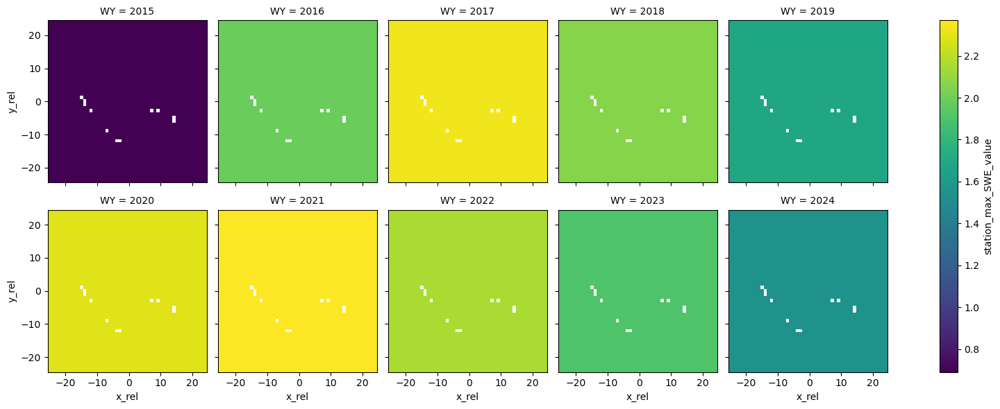

In [14]:
runoff_onset_max_swe_timing_read_ds['station_max_SWE_value'].sel(station='679_WA_SNTL').plot.imshow(col='WY',col_wrap=5)

Original shapes:
sar_minus_95pct: (969, 10, 49, 50)
fcf: (969, 49, 50)
fcf_broadcasted: (969, 10, 49, 50)
Flattened arrays length: 23740500
Clean data length: 4975984 (21.0% of original)
SAR range: [-158.00, 214.00]
FCF range: [0.00, 100.00]


AttributeError: PolyCollection.set() got an unexpected keyword argument 'cbar'

<Figure size 1500x1500 with 0 Axes>

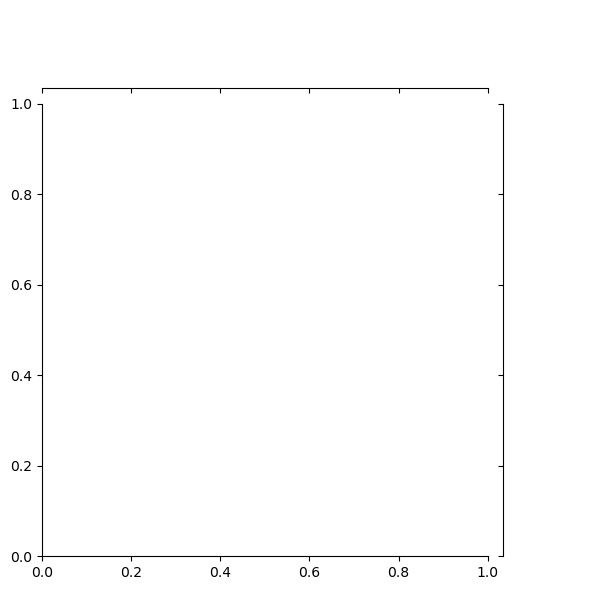

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Extract the variables from your dataset
sar_minus_95pct = runoff_onset_max_swe_timing_read_ds['sar_minus_95pct']
fcf = runoff_onset_max_swe_timing_read_ds['fcf']

print("Original shapes:")
print(f"sar_minus_95pct: {sar_minus_95pct.shape}")
print(f"fcf: {fcf.shape}")

# Broadcast fcf to match sar_minus_95pct dimensions
# fcf needs to be expanded to include the WY dimension
fcf_broadcasted = np.broadcast_to(fcf.values[:, np.newaxis, :, :], sar_minus_95pct.shape)

print(f"fcf_broadcasted: {fcf_broadcasted.shape}")

# Flatten both arrays
sar_flat = sar_minus_95pct.values.flatten()
fcf_flat = fcf_broadcasted.flatten()

print(f"Flattened arrays length: {len(sar_flat)}")

# Remove NaN values
mask = ~(np.isnan(sar_flat) | np.isnan(fcf_flat))
sar_clean = sar_flat[mask]
fcf_clean = fcf_flat[mask]

print(f"Clean data length: {len(sar_clean)} ({np.sum(mask)/len(mask)*100:.1f}% of original)")
print(f"SAR range: [{np.min(sar_clean):.2f}, {np.max(sar_clean):.2f}]")
print(f"FCF range: [{np.min(fcf_clean):.2f}, {np.max(fcf_clean):.2f}]")

# Create the joint plot
plt.figure(figsize=(15, 15))

# Option 1: Seaborn joint plot with hexbin
g = sns.jointplot(x=fcf_clean, 
                  y=sar_clean, 
                  kind='hex', 
                  gridsize=30, 
                  joint_kws={'cmap': 'viridis'},
                  cbar=True
                  )

g.plot_marginals(sns.histplot, 
                 element="step", 
                 color="#03012d")

g.set_axis_labels('Forest Canopy Fraction (FCF)', 'SAR minus 95th percentile')
plt.suptitle('Density Plot: SAR minus 95th percentile vs Forest Canopy Fraction', 
             y=1.02, fontsize=14)


Original shapes:
sar_minus_95pct: (969, 10, 49, 50)
fcf: (969, 49, 50)
fcf_broadcasted: (969, 10, 49, 50)
Flattened arrays length: 23740500
Clean data length: 4975984 (21.0% of original)
SAR range: [0.00, 214.00]
FCF range: [0.00, 100.00]


(0.0, 100.0)

<Figure size 1500x1500 with 0 Axes>

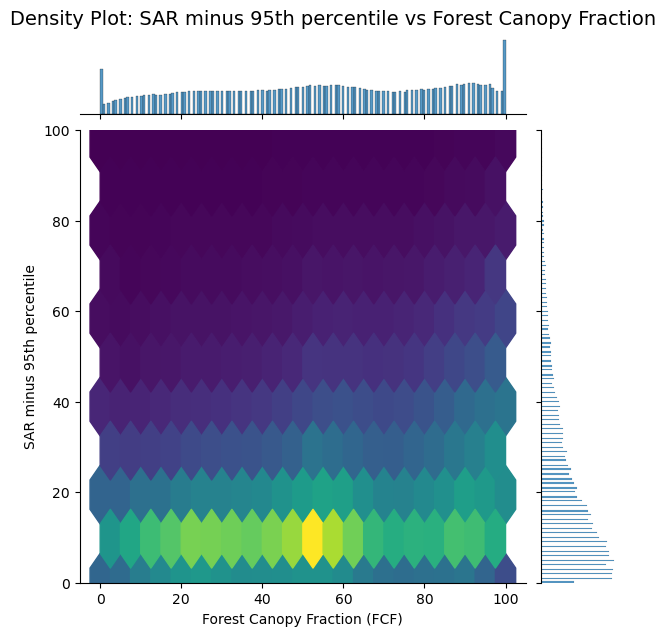

In [19]:
# Extract the variables from your dataset
sar_minus_95pct = runoff_onset_max_swe_timing_read_ds['sar_minus_95pct']
fcf = runoff_onset_max_swe_timing_read_ds['fcf']

print("Original shapes:")
print(f"sar_minus_95pct: {sar_minus_95pct.shape}")
print(f"fcf: {fcf.shape}")

# Broadcast fcf to match sar_minus_95pct dimensions
# fcf needs to be expanded to include the WY dimension
fcf_broadcasted = np.broadcast_to(fcf.values[:, np.newaxis, :, :], sar_minus_95pct.shape)

print(f"fcf_broadcasted: {fcf_broadcasted.shape}")

# Flatten both arrays
sar_flat = sar_minus_95pct.values.flatten()
fcf_flat = fcf_broadcasted.flatten()

print(f"Flattened arrays length: {len(sar_flat)}")

# Remove NaN values
mask = ~(np.isnan(sar_flat) | np.isnan(fcf_flat))
sar_clean = np.abs(sar_flat[mask])
fcf_clean = fcf_flat[mask]

print(f"Clean data length: {len(sar_clean)} ({np.sum(mask)/len(mask)*100:.1f}% of original)")
print(f"SAR range: [{np.min(sar_clean):.2f}, {np.max(sar_clean):.2f}]")
print(f"FCF range: [{np.min(fcf_clean):.2f}, {np.max(fcf_clean):.2f}]")

# Create the joint plot
plt.figure(figsize=(15, 15))

# Option 1: Seaborn joint plot with hexbin
g = sns.jointplot(x=fcf_clean, y=sar_clean, kind='hex', gridsize=20, 
                  joint_kws={'cmap': 'viridis'})
g.set_axis_labels('Forest Canopy Fraction (FCF)', 'SAR minus 95th percentile')
plt.suptitle('Density Plot: SAR minus 95th percentile vs Forest Canopy Fraction', 
             y=1.02, fontsize=14)

# set y axis limits to 0 and 100
g.ax_joint.set_ylim(0, 100)


Clean data points: 4975984
FCF range: [0.000, 100.000]
SAR range: [-158.000, 214.000]
Number of bins with >= 10 points: 20
Points per bin range: 174962 - 352705


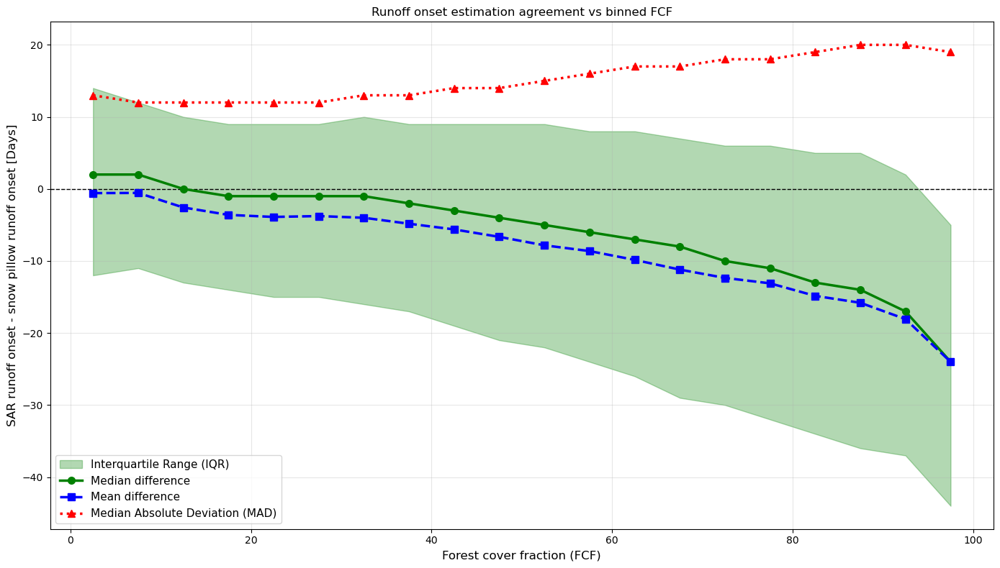


Bin Statistics Summary:
Mean correlation with FCF: -0.960
MAD correlation with FCF: 0.957

First 5 bins:
   fcf_bin_center      mean   mad   count
0             2.5 -0.578083  13.0  217787
1             7.5 -0.551583  12.0  174962
2            12.5 -2.569870  12.0  194318
3            17.5 -3.600399  12.0  211736
4            22.5 -3.886399  12.0  230025


In [20]:


# Extract the variables from your dataset
sar_minus_95pct = runoff_onset_max_swe_timing_read_ds['sar_minus_95pct']
fcf = runoff_onset_max_swe_timing_read_ds['fcf']

# Broadcast fcf to match sar_minus_95pct dimensions
fcf_broadcasted = np.broadcast_to(fcf.values[:, np.newaxis, :, :], sar_minus_95pct.shape)

# Flatten both arrays
sar_flat = sar_minus_95pct.values.flatten()
fcf_flat = fcf_broadcasted.flatten()

# Remove NaN values
mask = ~(np.isnan(sar_flat) | np.isnan(fcf_flat))
sar_clean = sar_flat[mask]
fcf_clean = fcf_flat[mask]

print(f"Clean data points: {len(sar_clean)}")
print(f"FCF range: [{np.min(fcf_clean):.3f}, {np.max(fcf_clean):.3f}]")
print(f"SAR range: [{np.min(sar_clean):.3f}, {np.max(sar_clean):.3f}]")

# Create DataFrame for easier manipulation
df = pd.DataFrame({
    'fcf': fcf_clean,
    'sar_minus_95pct': sar_clean
})

# Define FCF bins
n_bins = 20  # Adjust this number based on your data density
fcf_bins = np.linspace(df['fcf'].min(), df['fcf'].max(), n_bins + 1)
bin_centers = (fcf_bins[:-1] + fcf_bins[1:]) / 2

# Assign each point to a bin
df['fcf_bin'] = pd.cut(df['fcf'], bins=fcf_bins, labels=bin_centers, include_lowest=True)
df['fcf_bin'] = df['fcf_bin'].astype(float)

# Calculate statistics for each bin
def median_absolute_deviation(x):
    """Calculate median absolute deviation"""
    return np.median(np.abs(x - np.median(x)))

bin_stats = df.groupby('fcf_bin')['sar_minus_95pct'].agg([
    'mean', 
    'median',
    'std',
    'count',
    median_absolute_deviation,
    lambda x: np.percentile(x, 25),  # Q1
    lambda x: np.percentile(x, 75),  # Q3
]).reset_index()

bin_stats.columns = ['fcf_bin_center', 'mean', 'median', 'std', 'count', 'mad', 'q25', 'q75']

# Calculate standard error of the mean
bin_stats['sem'] = bin_stats['std'] / np.sqrt(bin_stats['count'])

# Filter out bins with too few points (optional)
min_points_per_bin = 10
bin_stats_filtered = bin_stats[bin_stats['count'] >= min_points_per_bin].copy()

print(f"Number of bins with >= {min_points_per_bin} points: {len(bin_stats_filtered)}")
print(f"Points per bin range: {bin_stats_filtered['count'].min()} - {bin_stats_filtered['count'].max()}")

# Create single combined plot
fig, ax = plt.subplots(1, 1, figsize=(14, 8))

# Plot median with IQR as shaded region
ax.fill_between(bin_stats_filtered['fcf_bin_center'],
               bin_stats_filtered['q25'],
               bin_stats_filtered['q75'],
               alpha=0.3, color='green', label='Interquartile Range (IQR)')

ax.plot(bin_stats_filtered['fcf_bin_center'], 
        bin_stats_filtered['median'],
        marker='o', linewidth=2.5, markersize=7, color='green', 
        label='Median difference', zorder=3)

# Add mean line
ax.plot(bin_stats_filtered['fcf_bin_center'], 
        bin_stats_filtered['mean'],
        marker='s', linewidth=2.5, markersize=7, color='blue', 
        linestyle='--', label='Mean difference', zorder=3)

# Add MAD line
ax.plot(bin_stats_filtered['fcf_bin_center'], 
         bin_stats_filtered['mad'],
         marker='^', linewidth=2.5, markersize=7,
         color='red', linestyle=':', label='Median Absolute Deviation (MAD)', zorder=3)

ax.set_xlabel('Forest cover fraction (FCF)', fontsize=12)
ax.set_ylabel('SAR runoff onset - snow pillow runoff onset [Days]', fontsize=12)
ax.set_title('Runoff onset estimation agreement vs binned FCF')
ax.grid(True, alpha=0.3)
ax.legend(fontsize=11, loc='best')

ax.axhline(0, color='black', linestyle='--', linewidth=1)

# Add secondary y-axis for MAD if the scales are very different
mad_range = bin_stats_filtered['mad'].max() - bin_stats_filtered['mad'].min()
data_range = bin_stats_filtered['median'].max() - bin_stats_filtered['median'].min()


plt.tight_layout()
plt.show()

# Print summary statistics
print("\nBin Statistics Summary:")
print(f"Mean correlation with FCF: {np.corrcoef(bin_stats_filtered['fcf_bin_center'], bin_stats_filtered['mean'])[0,1]:.3f}")
print(f"MAD correlation with FCF: {np.corrcoef(bin_stats_filtered['fcf_bin_center'], bin_stats_filtered['mad'])[0,1]:.3f}")

# Show the first few rows of statistics
print("\nFirst 5 bins:")
print(bin_stats_filtered[['fcf_bin_center', 'mean', 'mad', 'count']].head())

Clean data points: 4975984
Temporal resolution range: [1.4, 30.0]
SAR range: [-158.000, 214.000]
Number of bins with >= 10 points: 30
Points per bin range: 16657 - 728741


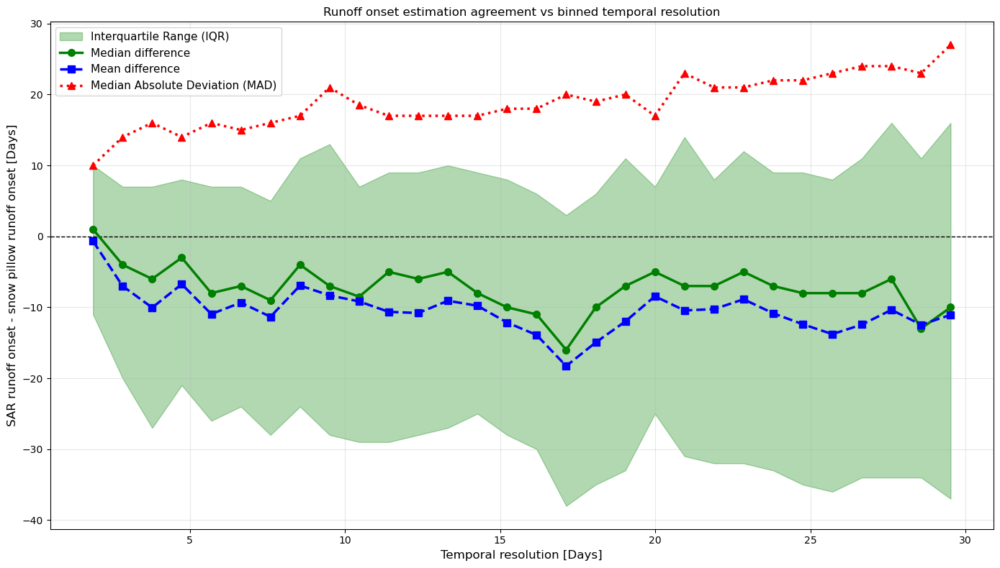


Bin Statistics Summary:
Mean correlation with temporal resolution: -0.517
MAD correlation with temporal resolution: 0.902

First 5 bins:
   temp_res_bin_center       mean   mad   count
0             1.876667  -0.680108  10.0  113279
1             2.830000  -7.000456  14.0  510953
2             3.783333 -10.043706  16.0  674423
3             4.736667  -6.739883  14.0  580827
4             5.690000 -10.948861  16.0  510410


In [21]:


# Extract the variables from your dataset
sar_minus_95pct = runoff_onset_max_swe_timing_read_ds['sar_minus_95pct']
temporal_resolution = runoff_onset_max_swe_timing_read_ds['temporal_resolution']

# Flatten both arrays
sar_flat = sar_minus_95pct.values.flatten()
temporal_res_flat = temporal_resolution.values.flatten()

# Remove NaN values
mask = ~(np.isnan(sar_flat) | np.isnan(temporal_res_flat))
sar_clean = sar_flat[mask]
temporal_res_clean = temporal_res_flat[mask]

print(f"Clean data points: {len(sar_clean)}")
print(f"Temporal resolution range: [{np.min(temporal_res_clean):.1f}, {np.max(temporal_res_clean):.1f}]")
print(f"SAR range: [{np.min(sar_clean):.3f}, {np.max(sar_clean):.3f}]")

# Create DataFrame for easier manipulation
df = pd.DataFrame({
    'temporal_resolution': temporal_res_clean,
    'sar_minus_95pct': sar_clean
})

# Define temporal resolution bins
n_bins = 30  # Adjust this number based on your data density
temp_res_bins = np.linspace(df['temporal_resolution'].min(), df['temporal_resolution'].max(), n_bins + 1)
bin_centers = (temp_res_bins[:-1] + temp_res_bins[1:]) / 2

# Assign each point to a bin
df['temp_res_bin'] = pd.cut(df['temporal_resolution'], bins=temp_res_bins, labels=bin_centers, include_lowest=True)
df['temp_res_bin'] = df['temp_res_bin'].astype(float)

# Calculate statistics for each bin
def median_absolute_deviation(x):
    """Calculate median absolute deviation"""
    return np.median(np.abs(x - np.median(x)))

bin_stats = df.groupby('temp_res_bin')['sar_minus_95pct'].agg([
    'mean', 
    'median',
    'std',
    'count',
    median_absolute_deviation,
    lambda x: np.percentile(x, 25),  # Q1
    lambda x: np.percentile(x, 75),  # Q3
]).reset_index()

bin_stats.columns = ['temp_res_bin_center', 'mean', 'median', 'std', 'count', 'mad', 'q25', 'q75']

# Calculate standard error of the mean
bin_stats['sem'] = bin_stats['std'] / np.sqrt(bin_stats['count'])

# Filter out bins with too few points (optional)
min_points_per_bin = 10
bin_stats_filtered = bin_stats[bin_stats['count'] >= min_points_per_bin].copy()

print(f"Number of bins with >= {min_points_per_bin} points: {len(bin_stats_filtered)}")
print(f"Points per bin range: {bin_stats_filtered['count'].min()} - {bin_stats_filtered['count'].max()}")

# Create single combined plot
fig, ax = plt.subplots(1, 1, figsize=(14, 8))

# Plot median with IQR as shaded region
ax.fill_between(bin_stats_filtered['temp_res_bin_center'],
               bin_stats_filtered['q25'],
               bin_stats_filtered['q75'],
               alpha=0.3, color='green', label='Interquartile Range (IQR)')

ax.plot(bin_stats_filtered['temp_res_bin_center'], 
        bin_stats_filtered['median'],
        marker='o', linewidth=2.5, markersize=7, color='green', 
        label='Median difference', zorder=3)

# Add mean line
ax.plot(bin_stats_filtered['temp_res_bin_center'], 
        bin_stats_filtered['mean'],
        marker='s', linewidth=2.5, markersize=7, color='blue', 
        linestyle='--', label='Mean difference', zorder=3)

# Add MAD line
ax.plot(bin_stats_filtered['temp_res_bin_center'], 
         bin_stats_filtered['mad'],
         marker='^', linewidth=2.5, markersize=7,
         color='red', linestyle=':', label='Median Absolute Deviation (MAD)', zorder=3)

ax.set_xlabel('Temporal resolution [Days]', fontsize=12)
ax.set_ylabel('SAR runoff onset - snow pillow runoff onset [Days]', fontsize=12)
ax.set_title('Runoff onset estimation agreement vs binned temporal resolution')
ax.grid(True, alpha=0.3)
ax.legend(fontsize=11, loc='best')

ax.axhline(0, color='black', linestyle='--', linewidth=1)

# Add secondary y-axis for MAD if the scales are very different
mad_range = bin_stats_filtered['mad'].max() - bin_stats_filtered['mad'].min()
data_range = bin_stats_filtered['median'].max() - bin_stats_filtered['median'].min()

plt.tight_layout()
plt.show()

# Print summary statistics
print("\nBin Statistics Summary:")
print(f"Mean correlation with temporal resolution: {np.corrcoef(bin_stats_filtered['temp_res_bin_center'], bin_stats_filtered['mean'])[0,1]:.3f}")
print(f"MAD correlation with temporal resolution: {np.corrcoef(bin_stats_filtered['temp_res_bin_center'], bin_stats_filtered['mad'])[0,1]:.3f}")

# Show the first few rows of statistics
print("\nFirst 5 bins:")
print(bin_stats_filtered[['temp_res_bin_center', 'mean', 'mad', 'count']].head())

Clean data points: 4975984
Temporal resolution range: [1.4, 30.0]
FCF range: [0.000, 100.000]
SAR range: [-158.000, 214.000]


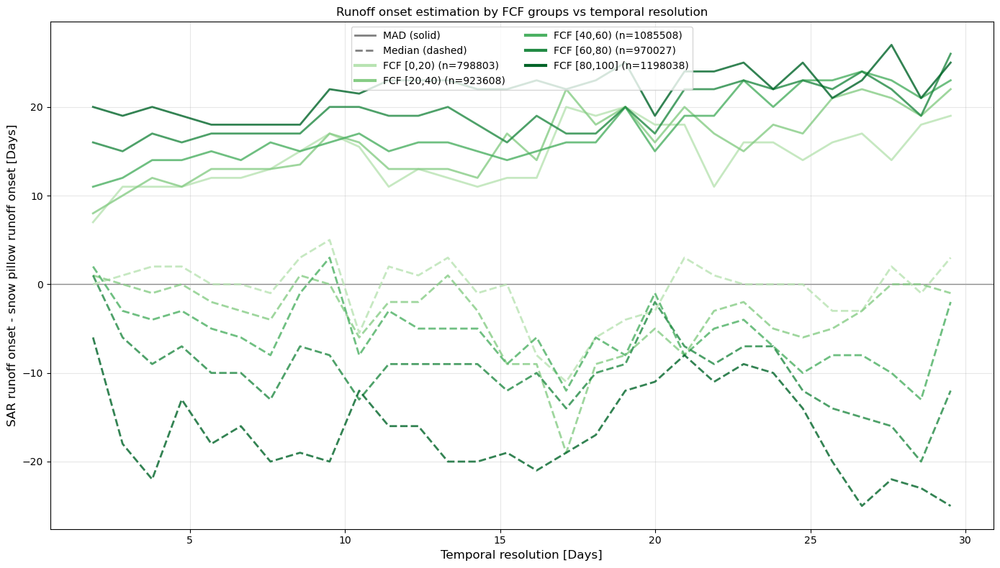


FCF Group Analysis Summary:
Temporal resolution bins: 30
Minimum points per temporal bin: 1000
FCF [0,20): 798803 total points, 30 valid temporal bins
FCF [20,40): 923608 total points, 30 valid temporal bins
FCF [40,60): 1085508 total points, 30 valid temporal bins
FCF [60,80): 970027 total points, 30 valid temporal bins
FCF [80,100]: 1198038 total points, 30 valid temporal bins

FCF distribution across groups:
FCF [0,20): 798803 points (16.1%)
FCF [20,40): 923608 points (18.6%)
FCF [40,60): 1085508 points (21.8%)
FCF [60,80): 970027 points (19.5%)
FCF [80,100]: 1198038 points (24.1%)


In [22]:

# Extract the variables from your dataset
sar_minus_95pct = runoff_onset_max_swe_timing_read_ds['sar_minus_95pct']
temporal_resolution = runoff_onset_max_swe_timing_read_ds['temporal_resolution']
fcf = runoff_onset_max_swe_timing_read_ds['fcf']

# Broadcast fcf to match other variables' dimensions
fcf_broadcasted = np.broadcast_to(fcf.values[:, np.newaxis, :, :], sar_minus_95pct.shape)

# Flatten all arrays
sar_flat = sar_minus_95pct.values.flatten()
temporal_res_flat = temporal_resolution.values.flatten()
fcf_flat = fcf_broadcasted.flatten()

# Remove NaN values
mask = ~(np.isnan(sar_flat) | np.isnan(temporal_res_flat) | np.isnan(fcf_flat))
sar_clean = sar_flat[mask]
temporal_res_clean = temporal_res_flat[mask]
fcf_clean = fcf_flat[mask]

print(f"Clean data points: {len(sar_clean)}")
print(f"Temporal resolution range: [{np.min(temporal_res_clean):.1f}, {np.max(temporal_res_clean):.1f}]")
print(f"FCF range: [{np.min(fcf_clean):.3f}, {np.max(fcf_clean):.3f}]")
print(f"SAR range: [{np.min(sar_clean):.3f}, {np.max(sar_clean):.3f}]")

# Create DataFrame
df = pd.DataFrame({
    'temporal_resolution': temporal_res_clean,
    'fcf': fcf_clean,
    'sar_minus_95pct': sar_clean
})

# Define FCF bins: [0,10), [10,20), ..., [90,100]
fcf_bin_edges = np.arange(0, 101, 20)  # [0, 10, 20, ..., 100]
fcf_bin_labels = [f'[{fcf_bin_edges[i]},{fcf_bin_edges[i+1]})' for i in range(len(fcf_bin_edges)-1)]
fcf_bin_labels[-1] = f'[{fcf_bin_edges[-2]},{fcf_bin_edges[-1]}]'  # Make last bin inclusive

# Convert FCF to percentage for binning
df['fcf_percent'] = df['fcf'] #* 100
df['fcf_group'] = pd.cut(df['fcf_percent'], bins=fcf_bin_edges, labels=fcf_bin_labels, include_lowest=True)

# Define temporal resolution bins
n_temp_bins = 30  # Fewer bins since we're splitting by FCF groups
temp_res_bins = np.linspace(df['temporal_resolution'].min(), df['temporal_resolution'].max(), n_temp_bins + 1)
temp_bin_centers = (temp_res_bins[:-1] + temp_res_bins[1:]) / 2

def median_absolute_deviation(x):
    """Calculate median absolute deviation"""
    if len(x) == 0:
        return np.nan
    return np.median(np.abs(x - np.median(x)))

# Create color palette - 10 shades of green from light to dark
green_colors = plt.cm.Greens(np.linspace(0.3, 0.9, 5))  # Start from 0.3 to avoid too light colors

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(14, 8))

# Store results for legend
legend_elements = []
fcf_group_stats = []

min_points_per_bin = 1000  # Lower threshold since we're splitting by FCF groups

# Process each FCF group
for i, (fcf_group, fcf_color) in enumerate(zip(fcf_bin_labels, green_colors)):
    # Filter data for this FCF group
    group_data = df[df['fcf_group'] == fcf_group].copy()
    
    if len(group_data) < min_points_per_bin:
        print(f"Skipping FCF group {fcf_group}: only {len(group_data)} points")
        continue
    
    # Bin by temporal resolution for this FCF group
    group_data['temp_res_bin'] = pd.cut(group_data['temporal_resolution'], 
                                       bins=temp_res_bins, labels=temp_bin_centers, include_lowest=True)
    group_data['temp_res_bin'] = group_data['temp_res_bin'].astype(float)
    
    # Calculate statistics for each temporal resolution bin within this FCF group
    bin_stats = group_data.groupby('temp_res_bin')['sar_minus_95pct'].agg([
        'median',
        'count',
        median_absolute_deviation
    ]).reset_index()
    
    bin_stats.columns = ['temp_res_bin_center', 'median', 'count', 'mad']
    
    # Filter out bins with too few points
    bin_stats_filtered = bin_stats[bin_stats['count'] >= min_points_per_bin].copy()
    
    if len(bin_stats_filtered) == 0:
        print(f"No valid bins for FCF group {fcf_group}")
        continue
    
    # Plot MAD as solid line
    mad_line = ax.plot(bin_stats_filtered['temp_res_bin_center'], 
                      bin_stats_filtered['mad'],
                      color=fcf_color, linewidth=2, linestyle='-', 
                      alpha=0.8, zorder=2)
    
    # Plot median as dashed line
    median_line = ax.plot(bin_stats_filtered['temp_res_bin_center'], 
                         bin_stats_filtered['median'],
                         color=fcf_color, linewidth=2, linestyle='--', 
                         alpha=0.8, zorder=2)
    
    # Store for legend (only add to legend if we actually plotted something)
    if len(bin_stats_filtered) > 0:
        fcf_group_stats.append({
            'group': fcf_group,
            'color': fcf_color,
            'n_points': len(group_data),
            'n_bins': len(bin_stats_filtered)
        })

# Create custom legend
legend_lines = []
legend_labels = []

# Add example solid and dashed lines for MAD and median
legend_lines.extend([plt.Line2D([0], [0], color='gray', linewidth=2, linestyle='-'),
                    plt.Line2D([0], [0], color='gray', linewidth=2, linestyle='--')])
legend_labels.extend(['MAD (solid)', 'Median (dashed)'])

# Add FCF group colors
for stats in fcf_group_stats:
    legend_lines.append(plt.Line2D([0], [0], color=stats['color'], linewidth=3))
    legend_labels.append(f"FCF {stats['group']} (n={stats['n_points']})")

ax.set_xlabel('Temporal resolution [Days]', fontsize=12)
ax.set_ylabel('SAR runoff onset - snow pillow runoff onset [Days]', fontsize=12)
ax.set_title('Runoff onset estimation by FCF groups vs temporal resolution')
ax.grid(True, alpha=0.3)

# Add zero reference line
ax.axhline(0, color='black', linestyle='-', linewidth=1, alpha=0.5, zorder=1)

# Create legend with two columns
ax.legend(legend_lines, legend_labels, loc='upper center', ncol=2, fontsize=10)

plt.tight_layout()
plt.show()

# Print summary statistics
print(f"\nFCF Group Analysis Summary:")
print(f"Temporal resolution bins: {n_temp_bins}")
print(f"Minimum points per temporal bin: {min_points_per_bin}")

for stats in fcf_group_stats:
    print(f"FCF {stats['group']}: {stats['n_points']} total points, {stats['n_bins']} valid temporal bins")

# Show overall FCF distribution
print(f"\nFCF distribution across groups:")
fcf_group_counts = df['fcf_group'].value_counts().sort_index()
for group, count in fcf_group_counts.items():
    print(f"FCF {group}: {count} points ({count/len(df)*100:.1f}%)")

Clean data points: 4975984
Temporal resolution range: [1.4, 30.0]
FCF range: [0.000, 100.000]
SAR range: [-158.000, 214.000]


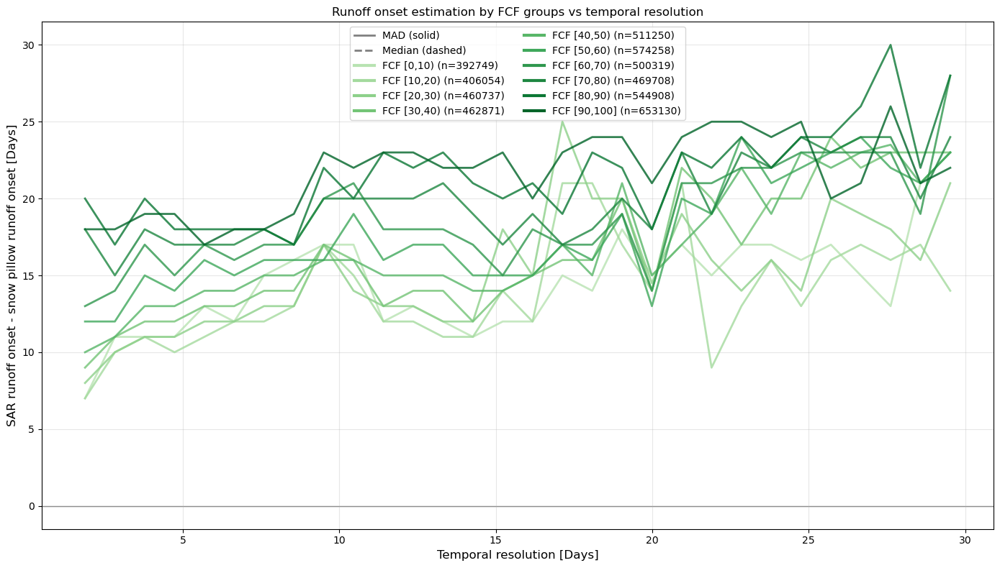


FCF Group Analysis Summary:
Temporal resolution bins: 30
Minimum points per temporal bin: 100
FCF [0,10): 392749 total points, 30 valid temporal bins
FCF [10,20): 406054 total points, 30 valid temporal bins
FCF [20,30): 460737 total points, 30 valid temporal bins
FCF [30,40): 462871 total points, 30 valid temporal bins
FCF [40,50): 511250 total points, 30 valid temporal bins
FCF [50,60): 574258 total points, 30 valid temporal bins
FCF [60,70): 500319 total points, 30 valid temporal bins
FCF [70,80): 469708 total points, 30 valid temporal bins
FCF [80,90): 544908 total points, 30 valid temporal bins
FCF [90,100]: 653130 total points, 30 valid temporal bins

FCF distribution across groups:
FCF [0,10): 392749 points (7.9%)
FCF [10,20): 406054 points (8.2%)
FCF [20,30): 460737 points (9.3%)
FCF [30,40): 462871 points (9.3%)
FCF [40,50): 511250 points (10.3%)
FCF [50,60): 574258 points (11.5%)
FCF [60,70): 500319 points (10.1%)
FCF [70,80): 469708 points (9.4%)
FCF [80,90): 544908 points (

In [23]:


# Extract the variables from your dataset
sar_minus_95pct = runoff_onset_max_swe_timing_read_ds['sar_minus_95pct']
temporal_resolution = runoff_onset_max_swe_timing_read_ds['temporal_resolution']
fcf = runoff_onset_max_swe_timing_read_ds['fcf']

# Broadcast fcf to match other variables' dimensions
fcf_broadcasted = np.broadcast_to(fcf.values[:, np.newaxis, :, :], sar_minus_95pct.shape)

# Flatten all arrays
sar_flat = sar_minus_95pct.values.flatten()
temporal_res_flat = temporal_resolution.values.flatten()
fcf_flat = fcf_broadcasted.flatten()

# Remove NaN values
mask = ~(np.isnan(sar_flat) | np.isnan(temporal_res_flat) | np.isnan(fcf_flat))
sar_clean = sar_flat[mask]
temporal_res_clean = temporal_res_flat[mask]
fcf_clean = fcf_flat[mask]

print(f"Clean data points: {len(sar_clean)}")
print(f"Temporal resolution range: [{np.min(temporal_res_clean):.1f}, {np.max(temporal_res_clean):.1f}]")
print(f"FCF range: [{np.min(fcf_clean):.3f}, {np.max(fcf_clean):.3f}]")
print(f"SAR range: [{np.min(sar_clean):.3f}, {np.max(sar_clean):.3f}]")

# Create DataFrame
df = pd.DataFrame({
    'temporal_resolution': temporal_res_clean,
    'fcf': fcf_clean,
    'sar_minus_95pct': sar_clean
})

# Define FCF bins: [0,10), [10,20), ..., [90,100]
fcf_bin_edges = np.arange(0, 101, 10)  # [0, 10, 20, ..., 100]
fcf_bin_labels = [f'[{fcf_bin_edges[i]},{fcf_bin_edges[i+1]})' for i in range(len(fcf_bin_edges)-1)]
fcf_bin_labels[-1] = f'[{fcf_bin_edges[-2]},{fcf_bin_edges[-1]}]'  # Make last bin inclusive

# Convert FCF to percentage for binning
df['fcf_percent'] = df['fcf'] #* 100
df['fcf_group'] = pd.cut(df['fcf_percent'], bins=fcf_bin_edges, labels=fcf_bin_labels, include_lowest=True)

# Define temporal resolution bins
n_temp_bins = 30  # Fewer bins since we're splitting by FCF groups
temp_res_bins = np.linspace(df['temporal_resolution'].min(), df['temporal_resolution'].max(), n_temp_bins + 1)
temp_bin_centers = (temp_res_bins[:-1] + temp_res_bins[1:]) / 2

def median_absolute_deviation(x):
    """Calculate median absolute deviation"""
    if len(x) == 0:
        return np.nan
    return np.median(np.abs(x - np.median(x)))

# Create color palette - 10 shades of green from light to dark
green_colors = plt.cm.Greens(np.linspace(0.3, 0.9, 10))  # Start from 0.3 to avoid too light colors

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(14, 8))

# Store results for legend
legend_elements = []
fcf_group_stats = []

min_points_per_bin = 100  # Lower threshold since we're splitting by FCF groups

# Process each FCF group
for i, (fcf_group, fcf_color) in enumerate(zip(fcf_bin_labels, green_colors)):
    # Filter data for this FCF group
    group_data = df[df['fcf_group'] == fcf_group].copy()
    
    if len(group_data) < min_points_per_bin:
        print(f"Skipping FCF group {fcf_group}: only {len(group_data)} points")
        continue
    
    # Bin by temporal resolution for this FCF group
    group_data['temp_res_bin'] = pd.cut(group_data['temporal_resolution'], 
                                       bins=temp_res_bins, labels=temp_bin_centers, include_lowest=True)
    group_data['temp_res_bin'] = group_data['temp_res_bin'].astype(float)
    
    # Calculate statistics for each temporal resolution bin within this FCF group
    bin_stats = group_data.groupby('temp_res_bin')['sar_minus_95pct'].agg([
        'median',
        'count',
        median_absolute_deviation
    ]).reset_index()
    
    bin_stats.columns = ['temp_res_bin_center', 'median', 'count', 'mad']
    
    # Filter out bins with too few points
    bin_stats_filtered = bin_stats[bin_stats['count'] >= min_points_per_bin].copy()
    
    if len(bin_stats_filtered) == 0:
        print(f"No valid bins for FCF group {fcf_group}")
        continue
    
    # Plot MAD as solid line
    mad_line = ax.plot(bin_stats_filtered['temp_res_bin_center'], 
                      bin_stats_filtered['mad'],
                      color=fcf_color, linewidth=2, linestyle='-', 
                      alpha=0.8, zorder=2)
    
    # # Plot median as dashed line
    # median_line = ax.plot(bin_stats_filtered['temp_res_bin_center'], 
    #                      bin_stats_filtered['median'],
    #                      color=fcf_color, linewidth=2, linestyle='--', 
    #                      alpha=0.8, zorder=2)
    
    # Store for legend (only add to legend if we actually plotted something)
    if len(bin_stats_filtered) > 0:
        fcf_group_stats.append({
            'group': fcf_group,
            'color': fcf_color,
            'n_points': len(group_data),
            'n_bins': len(bin_stats_filtered)
        })

# Create custom legend
legend_lines = []
legend_labels = []

# Add example solid and dashed lines for MAD and median
legend_lines.extend([plt.Line2D([0], [0], color='gray', linewidth=2, linestyle='-'),
                    plt.Line2D([0], [0], color='gray', linewidth=2, linestyle='--')])
legend_labels.extend(['MAD (solid)', 'Median (dashed)'])

# Add FCF group colors
for stats in fcf_group_stats:
    legend_lines.append(plt.Line2D([0], [0], color=stats['color'], linewidth=3))
    legend_labels.append(f"FCF {stats['group']} (n={stats['n_points']})")

ax.set_xlabel('Temporal resolution [Days]', fontsize=12)
ax.set_ylabel('SAR runoff onset - snow pillow runoff onset [Days]', fontsize=12)
ax.set_title('Runoff onset estimation by FCF groups vs temporal resolution')
ax.grid(True, alpha=0.3)

# Add zero reference line
ax.axhline(0, color='black', linestyle='-', linewidth=1, alpha=0.5, zorder=1)

# Create legend with two columns
ax.legend(legend_lines, legend_labels, loc='upper center', ncol=2, fontsize=10)

plt.tight_layout()
plt.show()

# Print summary statistics
print(f"\nFCF Group Analysis Summary:")
print(f"Temporal resolution bins: {n_temp_bins}")
print(f"Minimum points per temporal bin: {min_points_per_bin}")

for stats in fcf_group_stats:
    print(f"FCF {stats['group']}: {stats['n_points']} total points, {stats['n_bins']} valid temporal bins")

# Show overall FCF distribution
print(f"\nFCF distribution across groups:")
fcf_group_counts = df['fcf_group'].value_counts().sort_index()
for group, count in fcf_group_counts.items():
    print(f"FCF {group}: {count} points ({count/len(df)*100:.1f}%)")

In [24]:
sar_minus_95pct = runoff_onset_max_swe_timing_read_ds['sar_minus_95pct']
fcf = runoff_onset_max_swe_timing_read_ds['fcf']
temporal_resolution = runoff_onset_max_swe_timing_read_ds['temporal_resolution']

print("Original shapes:")
print(f"sar_minus_95pct: {sar_minus_95pct.shape}")
print(f"fcf: {fcf.shape}")
print(f"temporal_resolution: {temporal_resolution.shape}")

# Broadcast fcf to match other variables' dimensions
fcf_broadcasted = np.broadcast_to(fcf.values[:, np.newaxis, :, :], sar_minus_95pct.shape)

# Flatten all arrays
sar_flat = sar_minus_95pct.values.flatten()
fcf_flat = fcf_broadcasted.flatten()
temporal_res_flat = temporal_resolution.values.flatten()

# Remove NaN values
mask = ~(np.isnan(sar_flat) | np.isnan(fcf_flat) | np.isnan(temporal_res_flat))
sar_clean = sar_flat[mask]
fcf_clean = fcf_flat[mask]
temporal_res_clean = temporal_res_flat[mask]

print(f"Clean data points: {len(sar_clean)}")
print(f"FCF range: [{np.min(fcf_clean):.3f}, {np.max(fcf_clean):.3f}]")
print(f"Temporal resolution range: [{np.min(temporal_res_clean):.1f}, {np.max(temporal_res_clean):.1f}]")
print(f"SAR range: [{np.min(sar_clean):.3f}, {np.max(sar_clean):.3f}]")

# Create DataFrame
df = pd.DataFrame({
    'fcf': fcf_clean,
    'temporal_resolution': temporal_res_clean,
    'sar_minus_95pct': sar_clean
})

df

Original shapes:
sar_minus_95pct: (969, 10, 49, 50)
fcf: (969, 49, 50)
temporal_resolution: (969, 10, 49, 50)
Clean data points: 4975984
FCF range: [0.000, 100.000]
Temporal resolution range: [1.4, 30.0]
SAR range: [-158.000, 214.000]


,fcf,temporal_resolution,sar_minus_95pct
0,39.0,4.3,4.0
1,39.0,4.3,-15.0
2,50.0,4.4,-15.0
3,56.0,4.2,-15.0
4,52.0,4.2,-15.0
...,...,...,...
4975979,99.0,6.2,-25.0
4975980,100.0,6.2,5.0
4975981,100.0,6.1,-1.0
4975982,100.0,6.1,-25.0


KeyError: 'temporal_resolution'

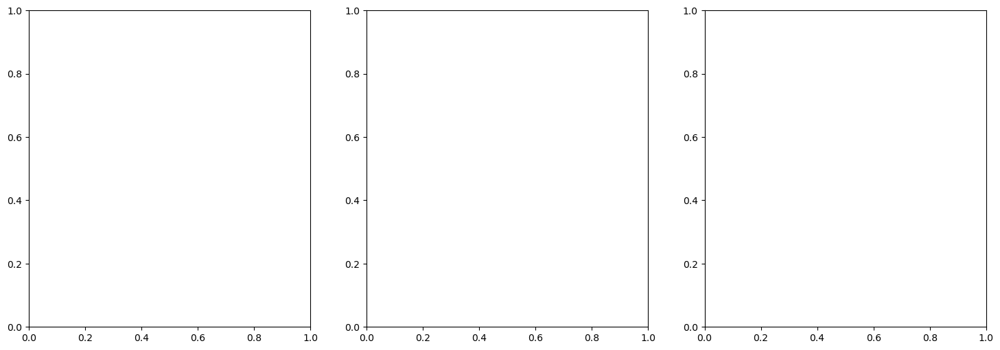

In [18]:


# Extract the variables from your dataset


# Define median absolute deviation function
def median_absolute_deviation(x):
    """Calculate median absolute deviation"""
    if len(x) == 0:
        return np.nan
    return np.median(np.abs(x - np.median(x)))

# Create the three hexbin plots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

min_count = 1000  # Minimum points per hexagon
gridsize = 30

# Plot 1: MAD using inferno colormap
hb1 = ax1.hexbin(df['fcf'], df['temporal_resolution'], C=df['sar_minus_95pct'], 
                 reduce_C_function=median_absolute_deviation, gridsize=gridsize, 
                 cmap='inferno', mincnt=min_count, alpha=0.8,vmin=5,vmax=30)

ax1.set_xlabel('Forest cover fraction (FCF)')
ax1.set_ylabel('Temporal resolution [days]')
ax1.set_title('Median absolute deviation of runoff onset estimation difference')
ax1.grid(True, alpha=0.3)

cbar1 = plt.colorbar(hb1, ax=ax1)
cbar1.set_label('Median absolute deviation (MAD) [days]', fontsize=11)

# Plot 2: Mean using RdYlBu colormap
hb2 = ax2.hexbin(df['fcf'], df['temporal_resolution'], C=df['sar_minus_95pct'], 
                 reduce_C_function=np.mean, gridsize=gridsize, 
                 cmap='RdYlBu', mincnt=min_count, vmin=-30,vmax=30, alpha=0.8)

ax2.set_xlabel('Forest cover fraction (FCF)')
ax2.set_ylabel('Temporal resolution [days]')
ax2.set_title('Mean runoff onset estimation difference (SAR - snow pillow)',)
ax2.grid(True, alpha=0.3)

cbar2 = plt.colorbar(hb2, ax=ax2)
cbar2.set_label('Mean difference (SAR - snow pillow) [days]')

# Plot 3: Count (density) with log scale using Orange colormap
hb3 = ax3.hexbin(df['fcf'], df['temporal_resolution'], gridsize=gridsize, 
                 cmap='Oranges', mincnt=1, alpha=0.8)

ax3.set_xlabel('Forest cover fraction (FCF)')
ax3.set_ylabel('Temporal resolution [days]')
ax3.set_title('Pixel counts in each bin',)
ax3.grid(True, alpha=0.3)

# Set log scale for the colorbar
cbar3 = plt.colorbar(hb3, ax=ax3)
cbar3.set_label('Pixel count (log scale)')

# Apply log scale to the count colorbar
import matplotlib.colors as colors
hb3.set_norm(colors.LogNorm())

plt.tight_layout()
plt.show()

# Summary statistics
print(f"\nHexbin Analysis Summary:")
print(f"Grid size: {gridsize}x{gridsize}")
print(f"Minimum points per hexagon: {min_count}")

# Calculate overall statistics
mad_overall = median_absolute_deviation(df['sar_minus_95pct'])
print(f"\nOverall statistics:")
print(f"MAD of SAR minus 95th percentile: {mad_overall:.3f}")
print(f"Mean SAR minus 95th percentile: {df['sar_minus_95pct'].mean():.3f}")
print(f"Standard deviation: {df['sar_minus_95pct'].std():.3f}")

# Show data distribution
print(f"\nData distribution quartiles:")
print(f"FCF: {np.percentile(df['fcf'], [25, 50, 75])}")
print(f"Temporal resolution: {np.percentile(df['temporal_resolution'], [25, 50, 75])}")
print(f"SAR minus 95pct: {np.percentile(df['sar_minus_95pct'], [25, 50, 75])}")

Original shapes:
sar_minus_95pct: (969, 10, 49, 50)
fcf: (969, 49, 50)
max_swe: (969, 10, 49, 50)
Clean data points: 4975984
FCF range: [0.000, 100.000]
Max SWE range: [0.1, 3.2]
SAR range: [-158.000, 214.000]


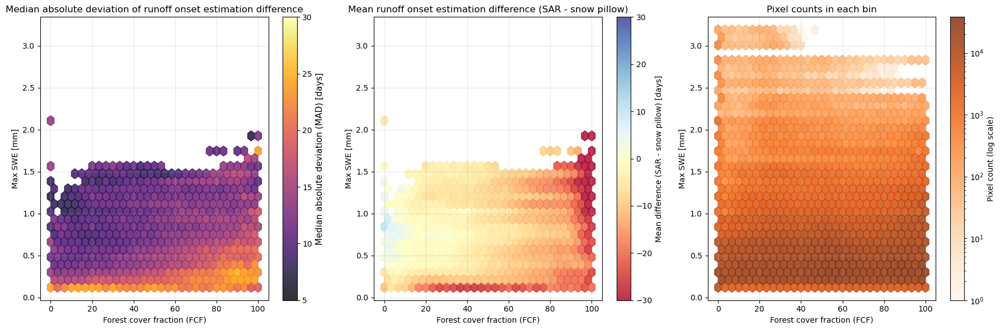


Hexbin Analysis Summary:
Grid size: 30x30
Minimum points per hexagon: 1000

Overall statistics:
MAD of SAR minus 95th percentile: 16.000
Mean SAR minus 95th percentile: -9.375
Standard deviation: 27.071

Data distribution quartiles:
FCF: [30. 55. 80.]
Max SWE: [0.29969999 0.44960001 0.68830001]
SAR minus 95pct: [-25.  -6.   8.]


In [25]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.colors as colors

# Extract the variables from your dataset
sar_minus_95pct = runoff_onset_max_swe_timing_read_ds['sar_minus_95pct']
fcf = runoff_onset_max_swe_timing_read_ds['fcf']

# Extract max SWE variable
max_swe = runoff_onset_max_swe_timing_read_ds['station_max_SWE_value']

print("Original shapes:")
print(f"sar_minus_95pct: {sar_minus_95pct.shape}")
print(f"fcf: {fcf.shape}")
print(f"max_swe: {max_swe.shape}")

# Broadcast fcf to match other variables' dimensions if needed
if fcf.shape != sar_minus_95pct.shape:
    fcf_broadcasted = np.broadcast_to(fcf.values[:, np.newaxis, :, :], sar_minus_95pct.shape)
else:
    fcf_broadcasted = fcf.values

# Handle max_swe broadcasting if needed
if max_swe.shape != sar_minus_95pct.shape:
    # If max_swe has different dimensions, broadcast appropriately
    if len(max_swe.shape) == 2:  # (station, WY)
        max_swe_broadcasted = np.broadcast_to(max_swe.values[:, :, np.newaxis, np.newaxis], sar_minus_95pct.shape)
    elif len(max_swe.shape) == 3:  # (station, y_rel, x_rel)
        max_swe_broadcasted = np.broadcast_to(max_swe.values[:, np.newaxis, :, :], sar_minus_95pct.shape)
    else:
        max_swe_broadcasted = max_swe.values
else:
    max_swe_broadcasted = max_swe.values

# Flatten all arrays
sar_flat = sar_minus_95pct.values.flatten()
fcf_flat = fcf_broadcasted.flatten()
max_swe_flat = max_swe_broadcasted.flatten()

# Remove NaN values
mask = ~(np.isnan(sar_flat) | np.isnan(fcf_flat) | np.isnan(max_swe_flat))
sar_clean = sar_flat[mask]
fcf_clean = fcf_flat[mask]
max_swe_clean = max_swe_flat[mask]

print(f"Clean data points: {len(sar_clean)}")
print(f"FCF range: [{np.min(fcf_clean):.3f}, {np.max(fcf_clean):.3f}]")
print(f"Max SWE range: [{np.min(max_swe_clean):.1f}, {np.max(max_swe_clean):.1f}]")
print(f"SAR range: [{np.min(sar_clean):.3f}, {np.max(sar_clean):.3f}]")

# Create DataFrame
df = pd.DataFrame({
    'fcf': fcf_clean,
    'max_swe': max_swe_clean,
    'sar_minus_95pct': sar_clean
})

# Define median absolute deviation function
def median_absolute_deviation(x):
    """Calculate median absolute deviation"""
    if len(x) == 0:
        return np.nan
    return np.median(np.abs(x - np.median(x)))

# Create the three hexbin plots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

min_count = 1000  # Minimum points per hexagon
gridsize = 30

# Plot 1: MAD using inferno colormap
hb1 = ax1.hexbin(df['fcf'], df['max_swe'], C=df['sar_minus_95pct'], 
                 reduce_C_function=median_absolute_deviation, gridsize=gridsize, 
                 cmap='inferno', mincnt=min_count, alpha=0.8, vmin=5, vmax=30)

ax1.set_xlabel('Forest cover fraction (FCF)')
ax1.set_ylabel('Max SWE [mm]')  # Adjust units as appropriate
ax1.set_title('Median absolute deviation of runoff onset estimation difference')
ax1.grid(True, alpha=0.3)

cbar1 = plt.colorbar(hb1, ax=ax1)
cbar1.set_label('Median absolute deviation (MAD) [days]', fontsize=11)

# Plot 2: Mean using RdYlBu colormap
hb2 = ax2.hexbin(df['fcf'], df['max_swe'], C=df['sar_minus_95pct'], 
                 reduce_C_function=np.mean, gridsize=gridsize, 
                 cmap='RdYlBu', mincnt=min_count, vmin=-30, vmax=30, alpha=0.8)

ax2.set_xlabel('Forest cover fraction (FCF)')
ax2.set_ylabel('Max SWE [mm]')  # Adjust units as appropriate
ax2.set_title('Mean runoff onset estimation difference (SAR - snow pillow)')
ax2.grid(True, alpha=0.3)

cbar2 = plt.colorbar(hb2, ax=ax2)
cbar2.set_label('Mean difference (SAR - snow pillow) [days]')

# Plot 3: Count (density) with log scale using Orange colormap
hb3 = ax3.hexbin(df['fcf'], df['max_swe'], gridsize=gridsize, 
                 cmap='Oranges', mincnt=1, alpha=0.8)

ax3.set_xlabel('Forest cover fraction (FCF)')
ax3.set_ylabel('Max SWE [mm]')  # Adjust units as appropriate
ax3.set_title('Pixel counts in each bin')
ax3.grid(True, alpha=0.3)

# Set log scale for the colorbar
cbar3 = plt.colorbar(hb3, ax=ax3)
cbar3.set_label('Pixel count (log scale)')

# Apply log scale to the count colorbar
hb3.set_norm(colors.LogNorm())

plt.tight_layout()
plt.show()

# Summary statistics
print(f"\nHexbin Analysis Summary:")
print(f"Grid size: {gridsize}x{gridsize}")
print(f"Minimum points per hexagon: {min_count}")

# Calculate overall statistics
mad_overall = median_absolute_deviation(df['sar_minus_95pct'])
print(f"\nOverall statistics:")
print(f"MAD of SAR minus 95th percentile: {mad_overall:.3f}")
print(f"Mean SAR minus 95th percentile: {df['sar_minus_95pct'].mean():.3f}")
print(f"Standard deviation: {df['sar_minus_95pct'].std():.3f}")

# Show data distribution
print(f"\nData distribution quartiles:")
print(f"FCF: {np.percentile(df['fcf'], [25, 50, 75])}")
print(f"Max SWE: {np.percentile(df['max_swe'], [25, 50, 75])}")
print(f"SAR minus 95pct: {np.percentile(df['sar_minus_95pct'], [25, 50, 75])}")

Original shapes:
sar_minus_95pct: (969, 10, 49, 50)
fcf: (969, 49, 50)
temporal_resolution: (969, 10, 49, 50)
max_swe: (969, 10, 49, 50)
Clean data points: 4975984
FCF range: [0.000, 100.000]
Temporal resolution range: [1.4, 30.0]
Max SWE range: [0.1, 3.2]
SAR range: [-158.000, 214.000]


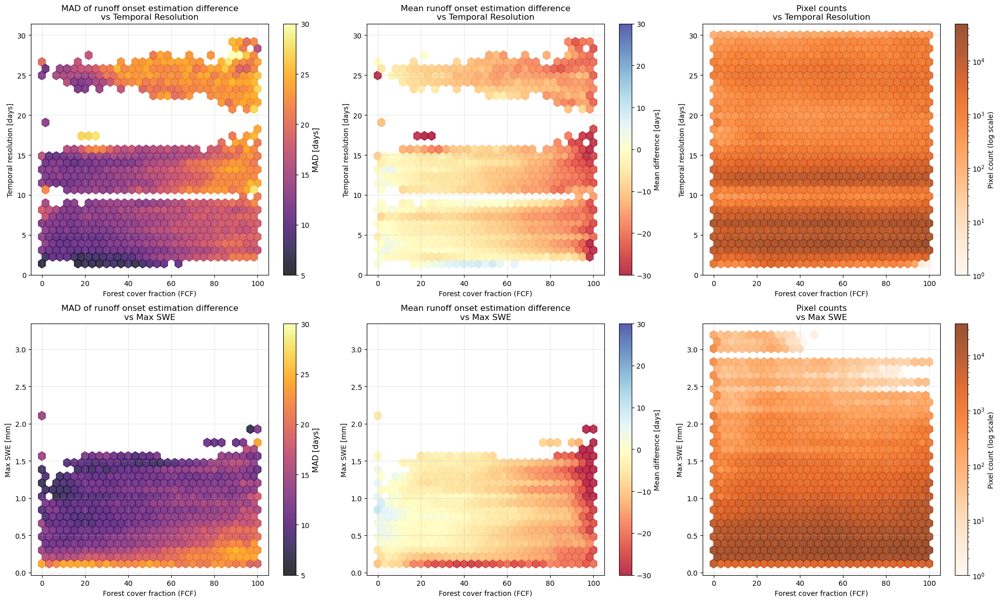


=== COMBINED ANALYSIS SUMMARY ===
Grid size: 30x30
Minimum points per hexagon: 1000

Overall statistics:
MAD of SAR minus 95th percentile: 16.000
Mean SAR minus 95th percentile: -9.375
Standard deviation: 27.124

Data distribution quartiles:
FCF: [30. 55. 80.]
Temporal resolution: [ 4.20000006  6.20000009 11.70000017]
Max SWE: [0.29969999 0.44960001 0.68830001]
SAR minus 95pct: [-25.  -6.   8.]

=== INTERPRETATION GUIDE ===
TOP ROW: FCF vs Temporal Resolution
- Left: Lower MAD (darker purple/black) = more consistent performance
- Middle: Blue regions = SAR estimates earlier, Red = SAR estimates later
- Right: More data in orange/red regions

BOTTOM ROW: FCF vs Max SWE
- Left: Lower MAD (darker purple/black) = more consistent performance
- Middle: Blue regions = SAR estimates earlier, Red = SAR estimates later
- Right: More data in orange/red regions

Look for:
- Regions where both rows show low MAD (good consistency)
- Regions where both rows show values near zero in middle plots (low

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.colors as colors

# Extract the variables from your dataset
sar_minus_95pct = runoff_onset_max_swe_timing_read_ds['sar_minus_95pct']
fcf = runoff_onset_max_swe_timing_read_ds['fcf']
temporal_resolution = runoff_onset_max_swe_timing_read_ds['temporal_resolution']
max_swe = runoff_onset_max_swe_timing_read_ds['station_max_SWE_value']

print("Original shapes:")
print(f"sar_minus_95pct: {sar_minus_95pct.shape}")
print(f"fcf: {fcf.shape}")
print(f"temporal_resolution: {temporal_resolution.shape}")
print(f"max_swe: {max_swe.shape}")

# Broadcast fcf to match other variables' dimensions
fcf_broadcasted = np.broadcast_to(fcf.values[:, np.newaxis, :, :], sar_minus_95pct.shape)

# Handle max_swe broadcasting
if len(max_swe.shape) == 2:  # (station, WY)
    max_swe_broadcasted = np.broadcast_to(max_swe.values[:, :, np.newaxis, np.newaxis], sar_minus_95pct.shape)
else:
    max_swe_broadcasted = max_swe.values

# Flatten all arrays
sar_flat = sar_minus_95pct.values.flatten()
fcf_flat = fcf_broadcasted.flatten()
temporal_res_flat = temporal_resolution.values.flatten()
max_swe_flat = max_swe_broadcasted.flatten()

# Remove NaN values
mask = ~(np.isnan(sar_flat) | np.isnan(fcf_flat) | np.isnan(temporal_res_flat) | np.isnan(max_swe_flat))
sar_clean = sar_flat[mask]
fcf_clean = fcf_flat[mask]
temporal_res_clean = temporal_res_flat[mask]
max_swe_clean = max_swe_flat[mask]

print(f"Clean data points: {len(sar_clean)}")
print(f"FCF range: [{np.min(fcf_clean):.3f}, {np.max(fcf_clean):.3f}]")
print(f"Temporal resolution range: [{np.min(temporal_res_clean):.1f}, {np.max(temporal_res_clean):.1f}]")
print(f"Max SWE range: [{np.min(max_swe_clean):.1f}, {np.max(max_swe_clean):.1f}]")
print(f"SAR range: [{np.min(sar_clean):.3f}, {np.max(sar_clean):.3f}]")

# Create DataFrames for both analyses
df_temp = pd.DataFrame({
    'fcf': fcf_clean,
    'temporal_resolution': temporal_res_clean,
    'sar_minus_95pct': sar_clean
})

df_swe = pd.DataFrame({
    'fcf': fcf_clean,
    'max_swe': max_swe_clean,
    'sar_minus_95pct': sar_clean
})

# Define median absolute deviation function
def median_absolute_deviation(x):
    """Calculate median absolute deviation"""
    if len(x) == 0:
        return np.nan
    return np.median(np.abs(x - np.median(x)))

# Create combined 2x3 plot
fig, axes = plt.subplots(2, 3, figsize=(20, 12))

min_count = 1000  # Minimum points per hexagon
gridsize = 30

# TOP ROW: FCF vs Temporal Resolution
# Plot 1: MAD using inferno colormap
hb1 = axes[0,0].hexbin(df_temp['fcf'], df_temp['temporal_resolution'], C=df_temp['sar_minus_95pct'], 
                       reduce_C_function=median_absolute_deviation, gridsize=gridsize, 
                       cmap='inferno', mincnt=min_count, alpha=0.8, vmin=5, vmax=30)

axes[0,0].set_xlabel('Forest cover fraction (FCF)')
axes[0,0].set_ylabel('Temporal resolution [days]')
axes[0,0].set_title('MAD of runoff onset estimation difference\nvs Temporal Resolution')
axes[0,0].grid(True, alpha=0.3)

cbar1 = plt.colorbar(hb1, ax=axes[0,0])
cbar1.set_label('MAD [days]', fontsize=11)

# Plot 2: Mean using RdYlBu colormap
hb2 = axes[0,1].hexbin(df_temp['fcf'], df_temp['temporal_resolution'], C=df_temp['sar_minus_95pct'], 
                       reduce_C_function=np.mean, gridsize=gridsize, 
                       cmap='RdYlBu', mincnt=min_count, vmin=-30, vmax=30, alpha=0.8)

axes[0,1].set_xlabel('Forest cover fraction (FCF)')
axes[0,1].set_ylabel('Temporal resolution [days]')
axes[0,1].set_title('Mean runoff onset estimation difference\nvs Temporal Resolution')
axes[0,1].grid(True, alpha=0.3)

cbar2 = plt.colorbar(hb2, ax=axes[0,1])
cbar2.set_label('Mean difference [days]')

# Plot 3: Count with log scale using Orange colormap
hb3 = axes[0,2].hexbin(df_temp['fcf'], df_temp['temporal_resolution'], gridsize=gridsize, 
                       cmap='Oranges', mincnt=1, alpha=0.8)

axes[0,2].set_xlabel('Forest cover fraction (FCF)')
axes[0,2].set_ylabel('Temporal resolution [days]')
axes[0,2].set_title('Pixel counts\nvs Temporal Resolution')
axes[0,2].grid(True, alpha=0.3)

cbar3 = plt.colorbar(hb3, ax=axes[0,2])
cbar3.set_label('Pixel count (log scale)')
hb3.set_norm(colors.LogNorm())

# BOTTOM ROW: FCF vs Max SWE
# Plot 4: MAD using inferno colormap
hb4 = axes[1,0].hexbin(df_swe['fcf'], df_swe['max_swe'], C=df_swe['sar_minus_95pct'], 
                       reduce_C_function=median_absolute_deviation, gridsize=gridsize, 
                       cmap='inferno', mincnt=min_count, alpha=0.8, vmin=5, vmax=30)

axes[1,0].set_xlabel('Forest cover fraction (FCF)')
axes[1,0].set_ylabel('Max SWE [mm]')
axes[1,0].set_title('MAD of runoff onset estimation difference\nvs Max SWE')
axes[1,0].grid(True, alpha=0.3)

cbar4 = plt.colorbar(hb4, ax=axes[1,0])
cbar4.set_label('MAD [days]', fontsize=11)

# Plot 5: Mean using RdYlBu colormap
hb5 = axes[1,1].hexbin(df_swe['fcf'], df_swe['max_swe'], C=df_swe['sar_minus_95pct'], 
                       reduce_C_function=np.mean, gridsize=gridsize, 
                       cmap='RdYlBu', mincnt=min_count, vmin=-30, vmax=30, alpha=0.8)

axes[1,1].set_xlabel('Forest cover fraction (FCF)')
axes[1,1].set_ylabel('Max SWE [mm]')
axes[1,1].set_title('Mean runoff onset estimation difference\nvs Max SWE')
axes[1,1].grid(True, alpha=0.3)

cbar5 = plt.colorbar(hb5, ax=axes[1,1])
cbar5.set_label('Mean difference [days]')

# Plot 6: Count with log scale using Orange colormap
hb6 = axes[1,2].hexbin(df_swe['fcf'], df_swe['max_swe'], gridsize=gridsize, 
                       cmap='Oranges', mincnt=1, alpha=0.8)

axes[1,2].set_xlabel('Forest cover fraction (FCF)')
axes[1,2].set_ylabel('Max SWE [mm]')
axes[1,2].set_title('Pixel counts\nvs Max SWE')
axes[1,2].grid(True, alpha=0.3)

cbar6 = plt.colorbar(hb6, ax=axes[1,2])
cbar6.set_label('Pixel count (log scale)')
hb6.set_norm(colors.LogNorm())

plt.tight_layout()
plt.show()

# Summary statistics for both analyses
print(f"\n=== COMBINED ANALYSIS SUMMARY ===")
print(f"Grid size: {gridsize}x{gridsize}")
print(f"Minimum points per hexagon: {min_count}")

# Calculate overall statistics
mad_overall = median_absolute_deviation(sar_clean)
print(f"\nOverall statistics:")
print(f"MAD of SAR minus 95th percentile: {mad_overall:.3f}")
print(f"Mean SAR minus 95th percentile: {np.mean(sar_clean):.3f}")
print(f"Standard deviation: {np.std(sar_clean):.3f}")

print(f"\nData distribution quartiles:")
print(f"FCF: {np.percentile(fcf_clean, [25, 50, 75])}")
print(f"Temporal resolution: {np.percentile(temporal_res_clean, [25, 50, 75])}")
print(f"Max SWE: {np.percentile(max_swe_clean, [25, 50, 75])}")
print(f"SAR minus 95pct: {np.percentile(sar_clean, [25, 50, 75])}")

print(f"\n=== INTERPRETATION GUIDE ===")
print(f"TOP ROW: FCF vs Temporal Resolution")
print(f"- Left: Lower MAD (darker purple/black) = more consistent performance")
print(f"- Middle: Blue regions = SAR estimates earlier, Red = SAR estimates later")
print(f"- Right: More data in orange/red regions")

print(f"\nBOTTOM ROW: FCF vs Max SWE") 
print(f"- Left: Lower MAD (darker purple/black) = more consistent performance")
print(f"- Middle: Blue regions = SAR estimates earlier, Red = SAR estimates later") 
print(f"- Right: More data in orange/red regions")

print(f"\nLook for:")
print(f"- Regions where both rows show low MAD (good consistency)")
print(f"- Regions where both rows show values near zero in middle plots (low bias)")
print(f"- Areas with sufficient data coverage (right plots)")

Original shapes:
sar_minus_95pct: (969, 10, 49, 50)
fcf: (969, 49, 50)
radius: (969, 50, 49)
Clean data points: 4975984
FCF range: [0.000, 100.000]
Radius range: [0.6, 1000.0]
SAR range: [-158.000, 214.000]


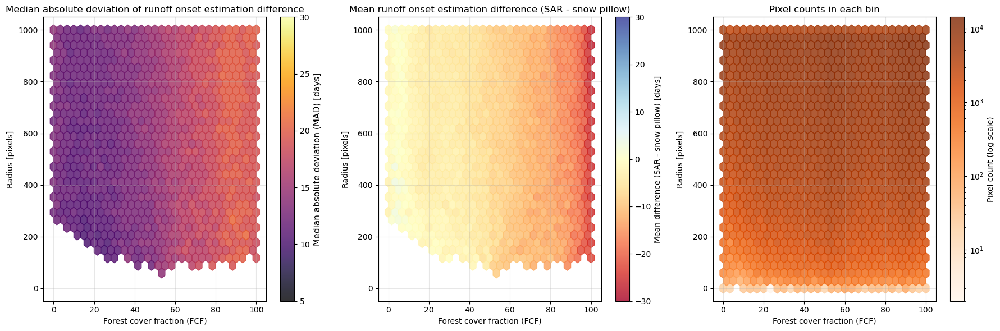


Hexbin Analysis Summary:
Grid size: 30x30
Minimum points per hexagon: 1000

Overall statistics:
MAD of SAR minus 95th percentile: 16.000
Mean SAR minus 95th percentile: -9.375
Standard deviation: 27.071

Data distribution quartiles:
FCF: [30. 55. 80.]
Radius: [499.06815338 706.13568115 865.32403564]
SAR minus 95pct: [-25.  -6.   8.]


In [18]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.colors as colors

# Extract the variables from your dataset
sar_minus_95pct = runoff_onset_max_swe_timing_read_ds['sar_minus_95pct']
fcf = runoff_onset_max_swe_timing_read_ds['fcf']
radius = runoff_onset_max_swe_timing_read_ds['radius']

print("Original shapes:")
print(f"sar_minus_95pct: {sar_minus_95pct.shape}")
print(f"fcf: {fcf.shape}")
print(f"radius: {radius.shape}")

# Broadcast fcf to match other variables' dimensions if needed
if fcf.shape != sar_minus_95pct.shape:
    fcf_broadcasted = np.broadcast_to(fcf.values[:, np.newaxis, :, :], sar_minus_95pct.shape)
else:
    fcf_broadcasted = fcf.values

# Handle radius broadcasting - radius has dimensions (station, x_rel, y_rel)
# but sar_minus_95pct has dimensions (station, WY, y_rel, x_rel)
# So we need to transpose radius to match the y_rel, x_rel order
if radius.shape != sar_minus_95pct.shape:
    # Transpose radius from (station, x_rel, y_rel) to (station, y_rel, x_rel)
    radius_transposed = radius.values.transpose(0, 2, 1)  # (969, 49, 50)
    # Then broadcast to include WY dimension: (station, WY, y_rel, x_rel)
    radius_broadcasted = np.broadcast_to(radius_transposed[:, np.newaxis, :, :], sar_minus_95pct.shape)
else:
    radius_broadcasted = radius.values

# Flatten all arrays
sar_flat = sar_minus_95pct.values.flatten()
fcf_flat = fcf_broadcasted.flatten()
radius_flat = radius_broadcasted.flatten()

# Remove NaN values
mask = ~(np.isnan(sar_flat) | np.isnan(fcf_flat) | np.isnan(radius_flat))
sar_clean = sar_flat[mask]
fcf_clean = fcf_flat[mask]
radius_clean = radius_flat[mask]

print(f"Clean data points: {len(sar_clean)}")
print(f"FCF range: [{np.min(fcf_clean):.3f}, {np.max(fcf_clean):.3f}]")
print(f"Radius range: [{np.min(radius_clean):.1f}, {np.max(radius_clean):.1f}]")
print(f"SAR range: [{np.min(sar_clean):.3f}, {np.max(sar_clean):.3f}]")

# Create DataFrame
df = pd.DataFrame({
    'fcf': fcf_clean,
    'radius': radius_clean,
    'sar_minus_95pct': sar_clean
})

# Define median absolute deviation function
def median_absolute_deviation(x):
    """Calculate median absolute deviation"""
    if len(x) == 0:
        return np.nan
    return np.median(np.abs(x - np.median(x)))

# Create the three hexbin plots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

min_count = 1000  # Minimum points per hexagon
gridsize = 30

# Plot 1: MAD using inferno colormap
hb1 = ax1.hexbin(df['fcf'], df['radius'], C=df['sar_minus_95pct'], 
                 reduce_C_function=median_absolute_deviation, gridsize=gridsize, 
                 cmap='inferno', mincnt=min_count, alpha=0.8, vmin=5, vmax=30)

ax1.set_xlabel('Forest cover fraction (FCF)')
ax1.set_ylabel('Radius [pixels]')
ax1.set_title('Median absolute deviation of runoff onset estimation difference')
ax1.grid(True, alpha=0.3)

cbar1 = plt.colorbar(hb1, ax=ax1)
cbar1.set_label('Median absolute deviation (MAD) [days]', fontsize=11)

# Plot 2: Mean using RdYlBu colormap
hb2 = ax2.hexbin(df['fcf'], df['radius'], C=df['sar_minus_95pct'], 
                 reduce_C_function=np.mean, gridsize=gridsize, 
                 cmap='RdYlBu', mincnt=min_count, vmin=-30, vmax=30, alpha=0.8)

ax2.set_xlabel('Forest cover fraction (FCF)')
ax2.set_ylabel('Radius [pixels]')
ax2.set_title('Mean runoff onset estimation difference (SAR - snow pillow)')
ax2.grid(True, alpha=0.3)

cbar2 = plt.colorbar(hb2, ax=ax2)
cbar2.set_label('Mean difference (SAR - snow pillow) [days]')

# Plot 3: Count (density) with log scale using Orange colormap
hb3 = ax3.hexbin(df['fcf'], df['radius'], gridsize=gridsize, 
                 cmap='Oranges', mincnt=1, alpha=0.8)

ax3.set_xlabel('Forest cover fraction (FCF)')
ax3.set_ylabel('Radius [pixels]')
ax3.set_title('Pixel counts in each bin')
ax3.grid(True, alpha=0.3)

# Set log scale for the colorbar
cbar3 = plt.colorbar(hb3, ax=ax3)
cbar3.set_label('Pixel count (log scale)')

# Apply log scale to the count colorbar
hb3.set_norm(colors.LogNorm())

plt.tight_layout()
plt.show()

# Summary statistics
print(f"\nHexbin Analysis Summary:")
print(f"Grid size: {gridsize}x{gridsize}")
print(f"Minimum points per hexagon: {min_count}")

# Calculate overall statistics
mad_overall = median_absolute_deviation(df['sar_minus_95pct'])
print(f"\nOverall statistics:")
print(f"MAD of SAR minus 95th percentile: {mad_overall:.3f}")
print(f"Mean SAR minus 95th percentile: {df['sar_minus_95pct'].mean():.3f}")
print(f"Standard deviation: {df['sar_minus_95pct'].std():.3f}")

# Show data distribution
print(f"\nData distribution quartiles:")
print(f"FCF: {np.percentile(df['fcf'], [25, 50, 75])}")
print(f"Radius: {np.percentile(df['radius'], [25, 50, 75])}")
print(f"SAR minus 95pct: {np.percentile(df['sar_minus_95pct'], [25, 50, 75])}")

Original shapes:
sar_minus_95pct: (969, 10, 49, 50)
fcf: (969, 49, 50)
temporal_resolution: (969, 10, 49, 50)
max_swe: (969, 10, 49, 50)
Clean data points: 4975984
FCF range: [0.000, 100.000]
Temporal resolution range: [1.4, 30.0]
Max SWE range: [0.1, 3.2]
Creating faceted analysis...
Percentile 1: 1013340 points
Percentile 2: 997341 points
Percentile 3: 976851 points
Percentile 4: 996722 points
Percentile 5: 991730 points


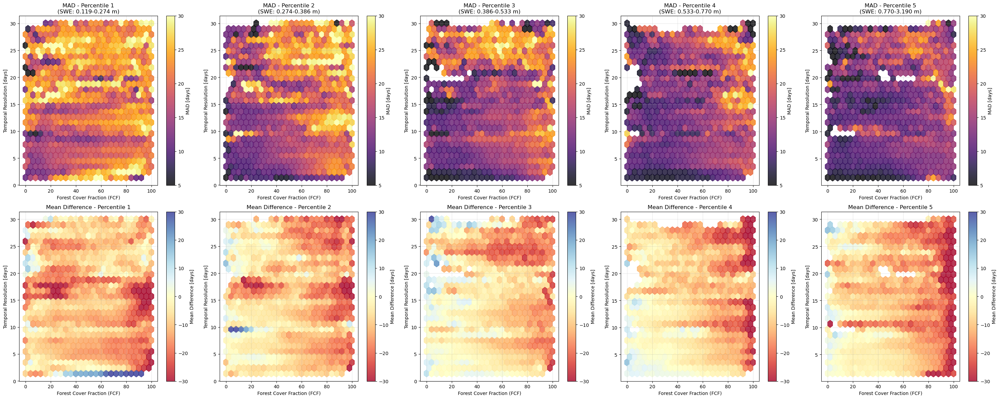

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.colors as colors
from mpl_toolkits.mplot3d import Axes3D

# Extract the variables from your dataset
sar_minus_95pct = runoff_onset_max_swe_timing_read_ds['sar_minus_95pct']
fcf = runoff_onset_max_swe_timing_read_ds['fcf']
temporal_resolution = runoff_onset_max_swe_timing_read_ds['temporal_resolution']
max_swe = runoff_onset_max_swe_timing_read_ds['station_max_SWE_value']

print("Original shapes:")
print(f"sar_minus_95pct: {sar_minus_95pct.shape}")
print(f"fcf: {fcf.shape}")
print(f"temporal_resolution: {temporal_resolution.shape}")
print(f"max_swe: {max_swe.shape}")

# Broadcast fcf to match other variables' dimensions
fcf_broadcasted = np.broadcast_to(fcf.values[:, np.newaxis, :, :], sar_minus_95pct.shape)

# Handle max_swe broadcasting (assuming it's (station, WY))
if len(max_swe.shape) == 2:  # (station, WY)
    max_swe_broadcasted = np.broadcast_to(max_swe.values[:, :, np.newaxis, np.newaxis], sar_minus_95pct.shape)
else:
    max_swe_broadcasted = max_swe.values

# Flatten all arrays
sar_flat = sar_minus_95pct.values.flatten()
fcf_flat = fcf_broadcasted.flatten()
temporal_res_flat = temporal_resolution.values.flatten()
max_swe_flat = max_swe_broadcasted.flatten()

# Remove NaN values
mask = ~(np.isnan(sar_flat) | np.isnan(fcf_flat) | np.isnan(temporal_res_flat) | np.isnan(max_swe_flat))
sar_clean = sar_flat[mask]
fcf_clean = fcf_flat[mask]
temporal_res_clean = temporal_res_flat[mask]
max_swe_clean = max_swe_flat[mask]

print(f"Clean data points: {len(sar_clean)}")
print(f"FCF range: [{np.min(fcf_clean):.3f}, {np.max(fcf_clean):.3f}]")
print(f"Temporal resolution range: [{np.min(temporal_res_clean):.1f}, {np.max(temporal_res_clean):.1f}]")
print(f"Max SWE range: [{np.min(max_swe_clean):.1f}, {np.max(max_swe_clean):.1f}]")

# Create DataFrame
df = pd.DataFrame({
    'fcf': fcf_clean,
    'temporal_resolution': temporal_res_clean,
    'max_swe': max_swe_clean,
    'sar_minus_95pct': sar_clean
})

def median_absolute_deviation(x):
    """Calculate median absolute deviation"""
    if len(x) == 0:
        return np.nan
    return np.median(np.abs(x - np.median(x)))

# APPROACH 1: Faceted hexbin plots by SWE ranges
print(f"Creating faceted analysis...")

# Define SWE bins (e.g., low, medium, high)
swe_percentiles = np.percentile(df['max_swe'], [0, 20, 40, 60, 80, 100])
swe_bins = pd.cut(df['max_swe'], bins=swe_percentiles, labels=['Percentile 1', 'Percentile 2', 'Percentile 3', 'Percentile 4', 'Percentile 5'], include_lowest=True)
df['swe_category'] = swe_bins

# Create faceted plot
fig, axes = plt.subplots(2, 5, figsize=(30, 12))
axes = axes.flatten()

min_count = 1000
gridsize = 25

for i, swe_cat in enumerate(['Percentile 1', 'Percentile 2', 'Percentile 3', 'Percentile 4', 'Percentile 5']):
    subset = df[df['swe_category'] == swe_cat]
    
    if len(subset) < min_count:
        print(f"Skipping {swe_cat}: only {len(subset)} points")
        continue
    
    # MAD plot
    ax_mad = axes[i]
    hb_mad = ax_mad.hexbin(subset['fcf'], subset['temporal_resolution'], 
                          C=subset['sar_minus_95pct'], 
                          reduce_C_function=median_absolute_deviation, 
                          gridsize=gridsize, cmap='inferno', 
                          mincnt=50, alpha=0.8, vmin=5, vmax=30)
    
    ax_mad.set_xlabel('Forest Cover Fraction (FCF)')
    ax_mad.set_ylabel('Temporal Resolution [days]')
    ax_mad.set_title(f'MAD - {swe_cat}\n(SWE: {swe_percentiles[i]:.3f}-{swe_percentiles[i+1]:.3f} m)')
    ax_mad.grid(True, alpha=0.3)
    
    cbar_mad = plt.colorbar(hb_mad, ax=ax_mad)
    cbar_mad.set_label('MAD [days]')
    
    # Mean difference plot
    ax_mean = axes[i+5]
    hb_mean = ax_mean.hexbin(subset['fcf'], subset['temporal_resolution'], 
                            C=subset['sar_minus_95pct'], 
                            reduce_C_function=np.mean, 
                            gridsize=gridsize, cmap='RdYlBu', 
                            mincnt=50, alpha=0.8, vmin=-30, vmax=30)
    
    ax_mean.set_xlabel('Forest Cover Fraction (FCF)')
    ax_mean.set_ylabel('Temporal Resolution [days]')
    ax_mean.set_title(f'Mean Difference - {swe_cat}')
    ax_mean.grid(True, alpha=0.3)
    
    cbar_mean = plt.colorbar(hb_mean, ax=ax_mean)
    cbar_mean.set_label('Mean Difference [days]')
    
    print(f"{swe_cat}: {len(subset)} points")

plt.tight_layout()
plt.show()


In [28]:
# Extract the variables from your dataset
sar_minus_95pct = runoff_onset_max_swe_timing_read_ds['sar_minus_95pct']
fcf = runoff_onset_max_swe_timing_read_ds['fcf']
temporal_resolution = runoff_onset_max_swe_timing_read_ds['temporal_resolution']
max_swe = runoff_onset_max_swe_timing_read_ds['station_max_SWE_value']

print("Original shapes:")
print(f"sar_minus_95pct: {sar_minus_95pct.shape}")
print(f"fcf: {fcf.shape}")
print(f"temporal_resolution: {temporal_resolution.shape}")
print(f"max_swe: {max_swe.shape}")

# Broadcast fcf to match other variables' dimensions
fcf_broadcasted = np.broadcast_to(fcf.values[:, np.newaxis, :, :], sar_minus_95pct.shape)

# Handle max_swe broadcasting (assuming it's (station, WY))
if len(max_swe.shape) == 2:  # (station, WY)
    max_swe_broadcasted = np.broadcast_to(max_swe.values[:, :, np.newaxis, np.newaxis], sar_minus_95pct.shape)
else:
    max_swe_broadcasted = max_swe.values

# Flatten all arrays
sar_flat = sar_minus_95pct.values.flatten()
fcf_flat = fcf_broadcasted.flatten()
temporal_res_flat = temporal_resolution.values.flatten()
max_swe_flat = max_swe_broadcasted.flatten()

# Remove NaN values
mask = ~(np.isnan(sar_flat) | np.isnan(fcf_flat) | np.isnan(temporal_res_flat) | np.isnan(max_swe_flat))
sar_clean = sar_flat[mask]
fcf_clean = fcf_flat[mask]
temporal_res_clean = temporal_res_flat[mask]
max_swe_clean = max_swe_flat[mask]

print(f"Clean data points: {len(sar_clean)}")
print(f"FCF range: [{np.min(fcf_clean):.3f}, {np.max(fcf_clean):.3f}]")
print(f"Temporal resolution range: [{np.min(temporal_res_clean):.1f}, {np.max(temporal_res_clean):.1f}]")
print(f"Max SWE range: [{np.min(max_swe_clean):.1f}, {np.max(max_swe_clean):.1f}]")

# Create DataFrame
df = pd.DataFrame({
    'fcf': fcf_clean,
    'temporal_resolution': temporal_res_clean,
    'max_swe': max_swe_clean,
    'sar_minus_95pct': sar_clean
})

df['max_swe'] = 100*df['max_swe']
df['fcf'] = df['fcf']/100

df

Original shapes:
sar_minus_95pct: (969, 10, 49, 50)
fcf: (969, 49, 50)
temporal_resolution: (969, 10, 49, 50)
max_swe: (969, 10, 49, 50)
Clean data points: 4975984
FCF range: [0.000, 100.000]
Temporal resolution range: [1.4, 30.0]
Max SWE range: [0.1, 3.2]


,fcf,temporal_resolution,max_swe,sar_minus_95pct
0,0.39,4.3,20.320000,4.0
1,0.39,4.3,20.320000,-15.0
2,0.50,4.4,20.320000,-15.0
3,0.56,4.2,20.320000,-15.0
4,0.52,4.2,20.320000,-15.0
...,...,...,...,...
4975979,0.99,6.2,27.689999,-25.0
4975980,1.00,6.2,27.689999,5.0
4975981,1.00,6.1,27.689999,-1.0
4975982,1.00,6.1,27.689999,-25.0


Creating faceted analysis...
10-20cm: 314805 points
20-30cm: 934392 points
30-40cm: 851318 points
40-50cm: 667394 points
50-60cm: 585470 points
60-70cm: 414231 points
70-80cm: 272879 points
80-90cm: 212805 points
90-100cm: 164659 points
100+cm: 555622 points


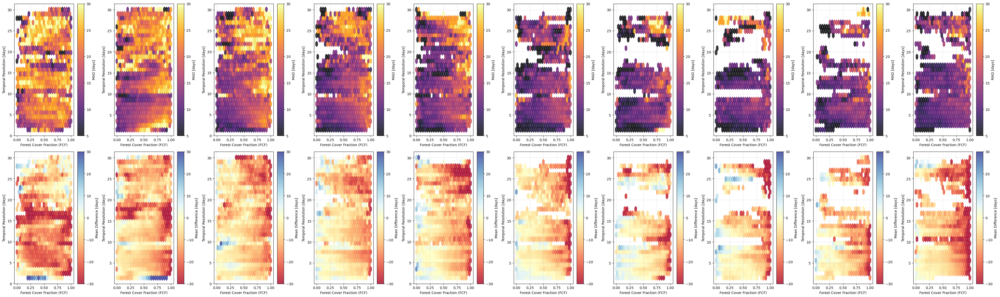

In [29]:


def median_absolute_deviation(x):
    """Calculate median absolute deviation"""
    if len(x) == 0:
        return np.nan
    return np.median(np.abs(x - np.median(x)))

# APPROACH 1: Faceted hexbin plots by SWE ranges
print(f"Creating faceted analysis...")

# Define SWE bins (e.g., low, medium, high)
#swe_percentiles = np.percentile(df['max_swe'], [0, 20, 40, 60, 80, 100])
swe_bin_edges = np.array([10,20,30,40,50,60,70,80,90,100,300])  # Example percentiles for demonstration
swe_bin_labels=['10-20cm', '20-30cm', '30-40cm', '40-50cm', '50-60cm', '60-70cm', '70-80cm', '80-90cm', '90-100cm', '100+cm']
swe_bins = pd.cut(df['max_swe'], bins=swe_bin_edges, labels=swe_bin_labels, include_lowest=True)


df['swe_category'] = swe_bins

# Create faceted plot
f, axs = plt.subplots(2, len(swe_bin_labels), figsize=(40, 12))
axs = axs.flatten()

min_count = 1000
gridsize = 25

for i, swe_cat in enumerate(swe_bin_labels):
    subset = df[df['swe_category'] == swe_cat]
    
    if len(subset) < min_count:
        print(f"Skipping {swe_cat}: only {len(subset)} points")
        continue
    
    # MAD plot
    ax_mad = axs[i]
    hb_mad = ax_mad.hexbin(subset['fcf'], subset['temporal_resolution'], 
                          C=subset['sar_minus_95pct'], 
                          reduce_C_function=median_absolute_deviation, 
                          gridsize=gridsize, cmap='inferno', 
                          mincnt=50, alpha=0.8, vmin=5, vmax=30)
    
    ax_mad.set_xlabel('Forest Cover Fraction (FCF)')
    ax_mad.set_ylabel('Temporal Resolution [days]')
    #ax_mad.set_title(f'MAD - {swe_cat}\n(SWE: {swe_bin_edges[i]:.3f}-{swe_bin_edges[i+1]:.3f} m)')
    ax_mad.grid(True, alpha=0.3)
    
    cbar_mad = plt.colorbar(hb_mad, ax=ax_mad)
    cbar_mad.set_label('MAD [days]')
    
    # Mean difference plot
    ax_mean = axs[i+len(swe_bin_labels)]
    hb_mean = ax_mean.hexbin(subset['fcf'], subset['temporal_resolution'], 
                            C=subset['sar_minus_95pct'], 
                            reduce_C_function=np.mean, 
                            gridsize=gridsize, cmap='RdYlBu', 
                            mincnt=50, alpha=0.8, vmin=-30, vmax=30)
    
    ax_mean.set_xlabel('Forest Cover Fraction (FCF)')
    ax_mean.set_ylabel('Temporal Resolution [days]')
    #ax_mean.set_title(f'Mean Difference - {swe_cat}')  
    ax_mean.grid(True, alpha=0.3)
    
    cbar_mean = plt.colorbar(hb_mean, ax=ax_mean)
    cbar_mean.set_label('Mean Difference [days]')
    
    print(f"{swe_cat}: {len(subset)} points")

f.tight_layout()


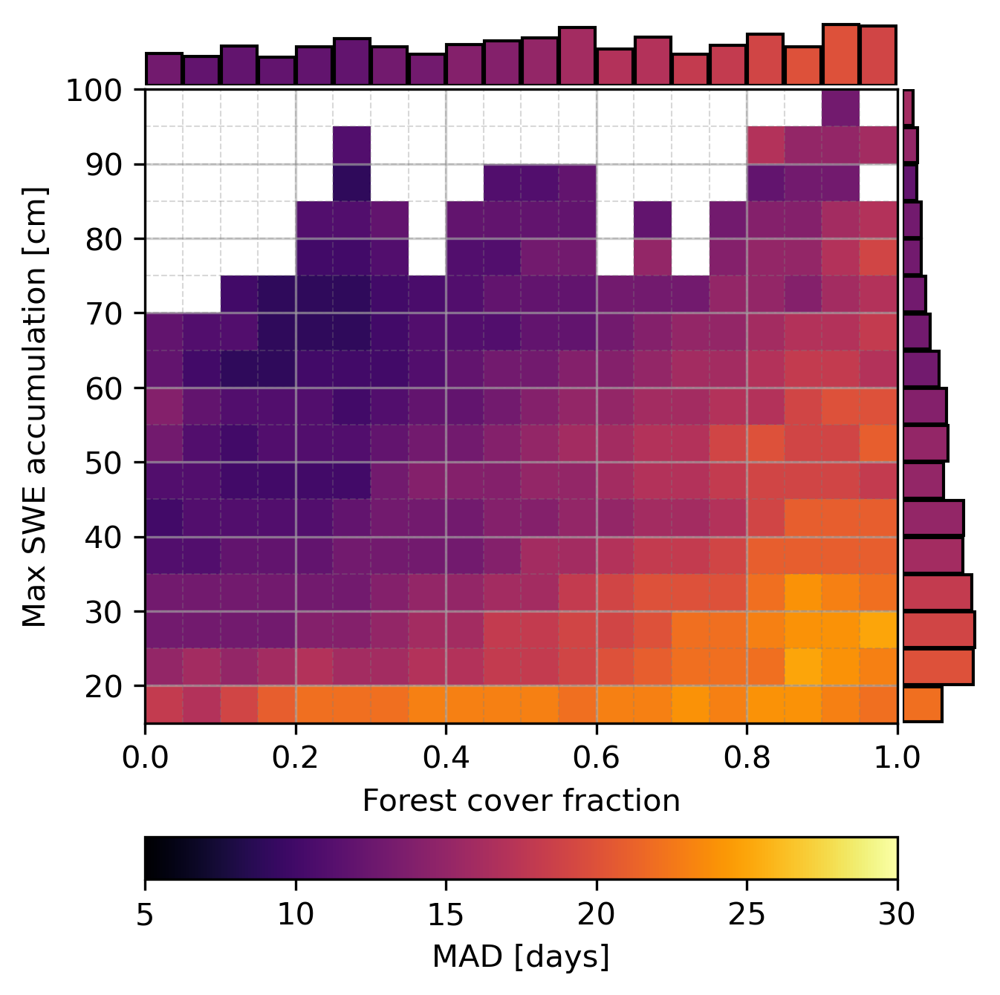

In [22]:
# Test the fixed pcolormesh implementation
import importlib
import station_plots
importlib.reload(station_plots)
from station_plots import create_2d_hist_with_1d_marginals, median_absolute_deviation

# Test with corrected pcolormesh usage
fig_pcolormesh_fixed = create_2d_hist_with_1d_marginals(
    pandas_df=df, 
    x_variable='fcf', 
    y_variable='max_swe', 
    c_variable='sar_minus_95pct', 
    reduce_C_function=median_absolute_deviation,
    plot_type='2dhist',  # This should now work without errors
    x_bin_width=0.05,       # 5% FCF bins
    y_bin_width=5,    # 0.05 m SWE bins  
    mincnt=5000, 
    cmap='inferno',
    alpha=1.0,
    vmin=5,
    vmax=30,
    cbar_label='MAD [days]', 
    x_label="Forest cover fraction", 
    y_label="Max SWE accumulation [cm]",
    x_min=0.0,
    x_max=1.0,
    y_min=15,
    y_max=100,
    figsize=(5, 5)
)


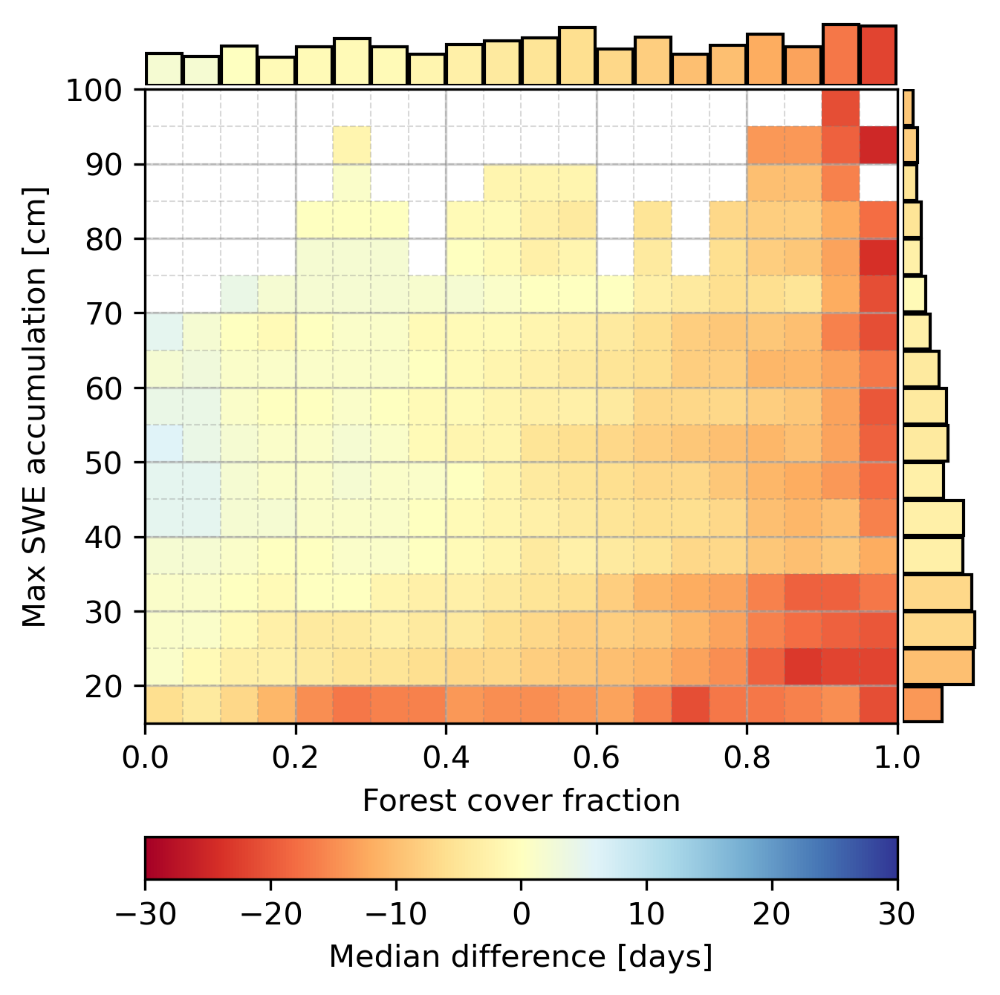

In [23]:
# Test the fixed pcolormesh implementation
import importlib
import station_plots
importlib.reload(station_plots)
from station_plots import create_2d_hist_with_1d_marginals, median_absolute_deviation

# Test with corrected pcolormesh usage
fig_pcolormesh_fixed = create_2d_hist_with_1d_marginals(
    pandas_df=df, 
    x_variable='fcf', 
    y_variable='max_swe', 
    c_variable='sar_minus_95pct', 
    reduce_C_function=np.median,
    plot_type='2dhist',  # This should now work without errors
    x_bin_width=0.05,       # 5% FCF bins
    y_bin_width=5,    # 0.05 m SWE bins  
    mincnt=5000, 
    cmap='RdYlBu',
    alpha=1.0,
    vmin=-30,
    vmax=30,
    cbar_label='Median difference [days]', 
    x_label="Forest cover fraction", 
    y_label="Max SWE accumulation [cm]",
    x_min=0.0,
    x_max=1.0,
    y_min=15,
    y_max=100,
    figsize=(5, 5)
)


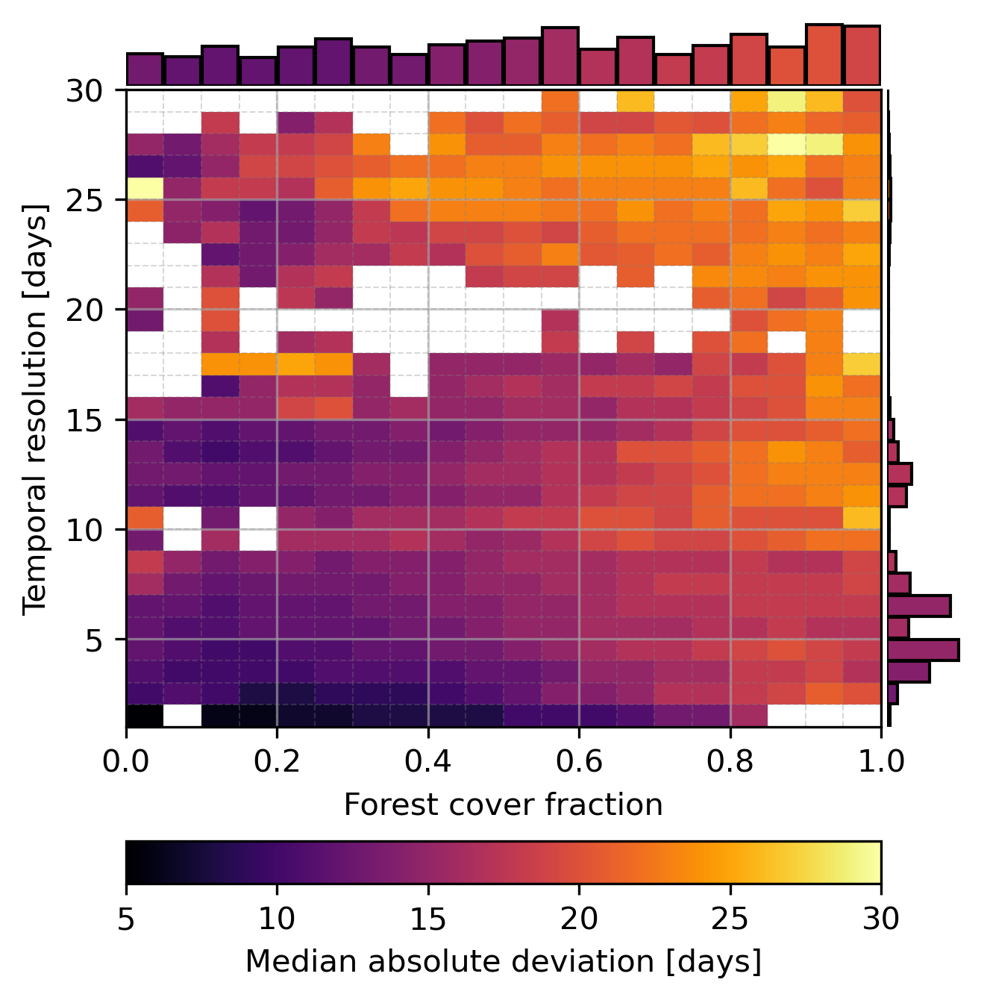

In [24]:
# Test the fixed pcolormesh implementation
import importlib
import station_plots
importlib.reload(station_plots)
from station_plots import create_2d_hist_with_1d_marginals, median_absolute_deviation

# Test with corrected pcolormesh usage
fig_pcolormesh_fixed = create_2d_hist_with_1d_marginals(
    pandas_df=df, 
    x_variable='fcf', 
    y_variable='temporal_resolution', 
    c_variable='sar_minus_95pct', 
    reduce_C_function=median_absolute_deviation,
    plot_type='2dhist',  # This should now work without errors
    x_bin_width=0.05,       # 5% FCF bins
    y_bin_width=1,    # 0.05 m SWE bins  
    mincnt=1000, 
    cmap='inferno',
    alpha=1.0,
    vmin=5,
    vmax=30,
    cbar_label='Median absolute deviation [days]', 
    x_label="Forest cover fraction", 
    y_label="Temporal resolution [days]",
    x_min=0.0,
    x_max=1.0,
    y_min=1,
    y_max=30,
    figsize=(5, 5)
)


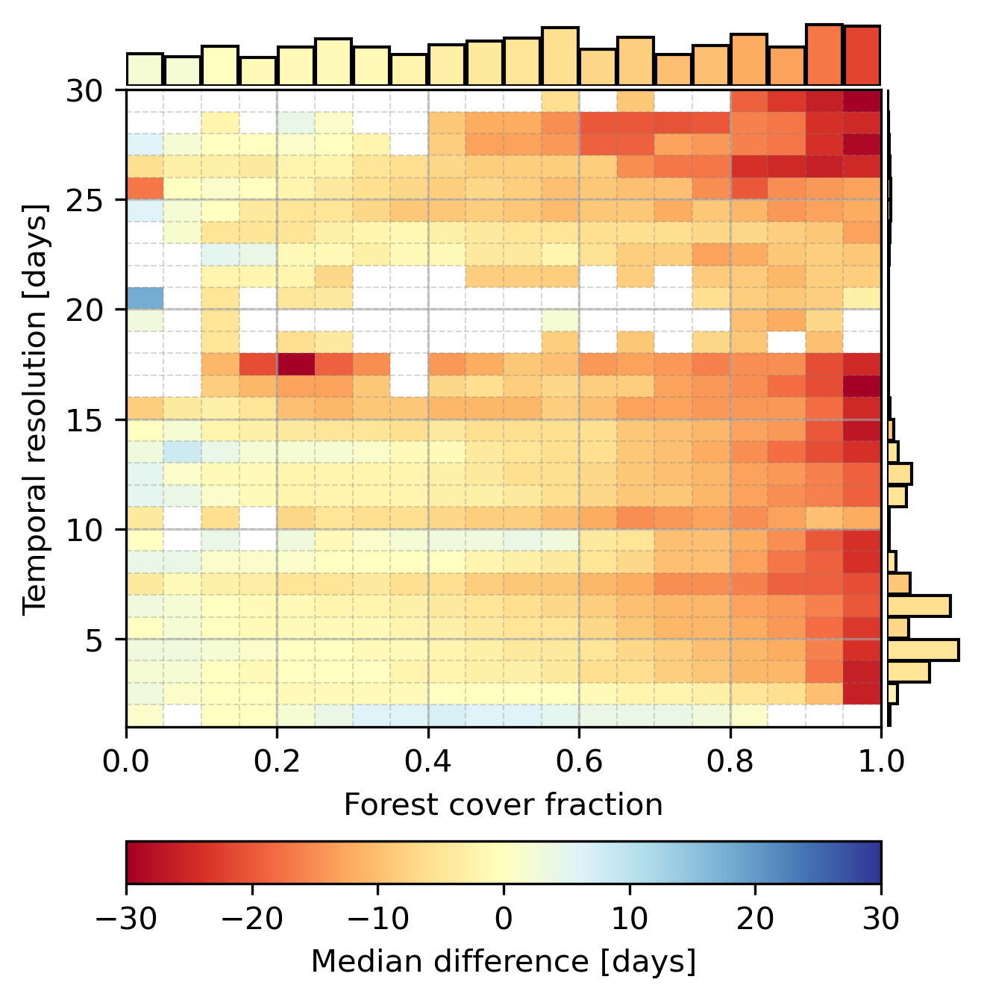

In [25]:
# Test the fixed pcolormesh implementation
import importlib
import station_plots
importlib.reload(station_plots)
from station_plots import create_2d_hist_with_1d_marginals, median_absolute_deviation

# Test with corrected pcolormesh usage
fig_pcolormesh_fixed = create_2d_hist_with_1d_marginals(
    pandas_df=df, 
    x_variable='fcf', 
    y_variable='temporal_resolution', 
    c_variable='sar_minus_95pct', 
    reduce_C_function=np.median,
    plot_type='2dhist',  # This should now work without errors
    x_bin_width=0.05,       # 5% FCF bins
    y_bin_width=1,    # 0.05 m SWE bins  
    mincnt=1000, 
    cmap='RdYlBu',
    alpha=1.0,
    vmin=-30,
    vmax=30,
    cbar_label='Median difference [days]', 
    x_label="Forest cover fraction", 
    y_label="Temporal resolution [days]",
    x_min=0.0,
    x_max=1.0,
    y_min=1,
    y_max=30,
    figsize=(5, 5)
)


Sample sizes by SWE category:
SWE < 25cm: 778,137 data points
25-50cm SWE: 1,989,772 data points
SWE ≥ 50cm: 2,208,075 data points


/tmp/ipykernel_489165/2457922854.py:105: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color=plt.cm.get_cmap(cmap)(norm(np.array(x_c_values)[valid_x])),
/tmp/ipykernel_489165/2457922854.py:124: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color=plt.cm.get_cmap(cmap)(norm(np.array(y_c_values)[valid_y])),


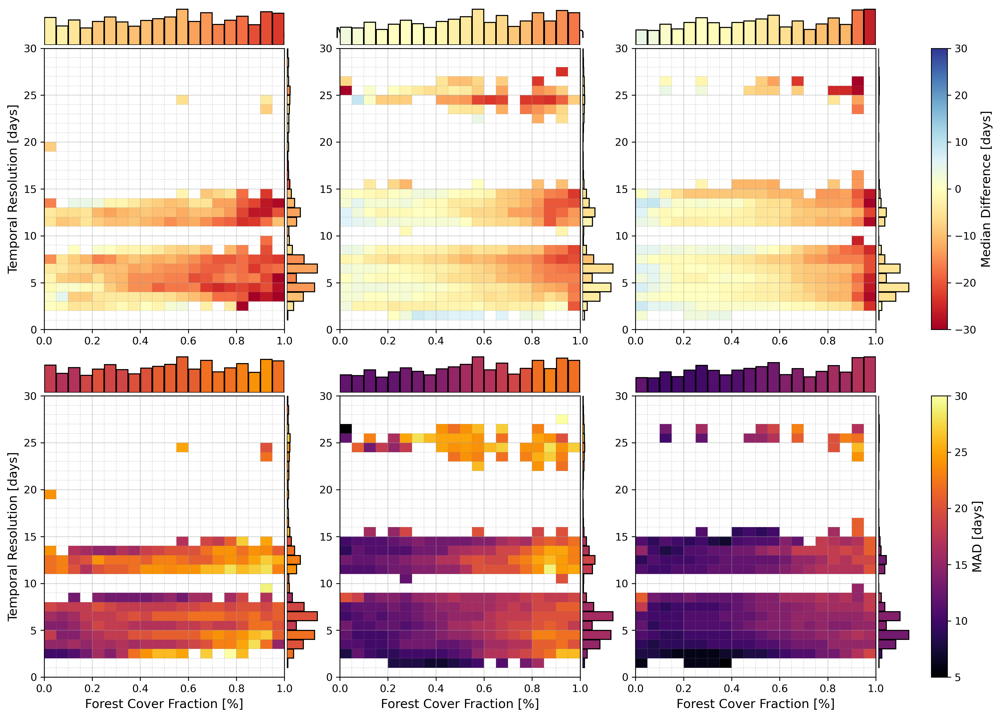

In [26]:
# Create single faceted grid with joint plots and shared colorbars
import importlib
import station_plots
importlib.reload(station_plots)
from station_plots import median_absolute_deviation
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import GridSpec
from matplotlib.colors import Normalize

# Define SWE ranges for faceting
df_facet = df_temp.copy()
df_facet['max_swe_cm'] = df_swe['max_swe'] * 100  # Convert m to cm
df_facet['fcf'] = df_facet['fcf'] / 100  # Convert FCF to fraction

def categorize_swe(swe_cm):
    if swe_cm < 25:
        return 'SWE < 25cm'
    elif swe_cm < 50:
        return '25-50cm SWE' 
    else:
        return 'SWE ≥ 50cm'

df_facet['swe_category'] = df_facet['max_swe_cm'].apply(categorize_swe)

categories = ['SWE < 25cm', '25-50cm SWE', 'SWE ≥ 50cm']
swe_ranges = ['< 25cm', '25-50cm', '≥ 50cm']

# Print sample sizes
print("Sample sizes by SWE category:")
for cat in categories:
    count = len(df_facet[df_facet['swe_category'] == cat])
    print(f"{cat}: {count:,} data points")

# Create the main figure with custom gridspec
# Layout: 2 rows (mean, MAD) × 3 columns (SWE ranges) + 2 colorbars
fig = plt.figure(figsize=(16,12),dpi=300)

# Define gridspec: 6 rows × 11 columns to accommodate joint plots + colorbars
# Each joint plot needs: main (3×3) + top marginal (1×3) + right marginal (3×1) + spacing
gs = GridSpec(6, 11, figure=fig,
              width_ratios=[3, 0.4, 0.2, 3, 0.4, 0.2, 3, 0.4, 0.2, 0.2, 0.3],  # 3 joint plots + 2 colorbars
              height_ratios=[0.4, 3, 0.2, 0.4, 3, 0.2],  # 2 rows of joint plots with spacing
              hspace=0.03, wspace=0.03)

# Function to create a single joint plot in the grid
def create_joint_plot_in_grid(data, row_start, col_start, reduce_func, cmap, vmin, vmax, title, cbar_label):
    """Create a joint plot within the larger gridspec"""
    
    # Define bin edges
    x_bins = np.arange(0, 1.05, 0.05)  # 5% FCF bins
    y_bins = np.arange(0, 31, 1)   # 1-day temporal resolution bins

    # Main plot position
    ax_main = fig.add_subplot(gs[row_start:row_start+1, col_start:col_start+1])
    
    # Marginal plot positions
    ax_top = fig.add_subplot(gs[row_start-1:row_start, col_start:col_start+1], sharex=ax_main)
    ax_right = fig.add_subplot(gs[row_start:row_start+1, col_start+1:col_start+2], sharey=ax_main)
    
    # Calculate 2D histogram and reduced C values
    hist_2d, x_edges, y_edges = np.histogram2d(data['fcf'], data['temporal_resolution'], bins=[x_bins, y_bins])
    c_values_2d = np.full(hist_2d.shape, np.nan)
    
    for i in range(len(x_edges) - 1):
        for j in range(len(y_edges) - 1):
            mask = ((data['fcf'] >= x_edges[i]) & (data['fcf'] < x_edges[i + 1]) &
                   (data['temporal_resolution'] >= y_edges[j]) & (data['temporal_resolution'] < y_edges[j + 1]))
            if np.sum(mask) >= 1000:
                c_values_2d[i, j] = reduce_func(data.loc[mask, 'sar_minus_95pct'])
    
    # Plot main 2D histogram
    im = ax_main.pcolormesh(x_edges, y_edges, c_values_2d.T, cmap=cmap, vmin=vmin, vmax=vmax, alpha=1)
    ax_main.set_title(title, fontsize=14, pad=10)
    ax_main.grid(True, alpha=0.3)
    # draw dashed lines 2d hist bins
    for x_edge in x_edges:
        ax_main.axvline(x_edge, color='gray', linestyle='--', linewidth=0.5, alpha=0.3)
    for y_edge in y_edges:
        ax_main.axhline(y_edge, color='gray', linestyle='--', linewidth=0.5, alpha=0.3)


    ax_main.set_xlim(0, 1.0)
    ax_main.set_ylim(0, 30)
    
    # Calculate marginal histograms with colors
    norm = Normalize(vmin=vmin, vmax=vmax)
    
    # X marginal (top)
    x_hist_counts, x_bin_edges = np.histogram(data['fcf'], bins=x_bins)
    x_bin_centers = (x_bin_edges[:-1] + x_bin_edges[1:]) / 2
    x_c_values = []
    
    for i in range(len(x_bin_edges) - 1):
        mask_x = (data['fcf'] >= x_bin_edges[i]) & (data['fcf'] < x_bin_edges[i + 1])
        if np.sum(mask_x) >= 1000:
            x_c_values.append(reduce_func(data.loc[mask_x, 'sar_minus_95pct']))
        else:
            x_c_values.append(np.nan)
    
    valid_x = ~np.isnan(x_c_values)
    if np.any(valid_x):
        ax_top.bar(x_bin_centers[valid_x], x_hist_counts[valid_x],
                   width=np.diff(x_bin_edges)[0] * 0.95,
                   color=plt.cm.get_cmap(cmap)(norm(np.array(x_c_values)[valid_x])),
                   alpha=1.0, edgecolor='black')
    
    # Y marginal (right)
    y_hist_counts, y_bin_edges = np.histogram(data['temporal_resolution'], bins=y_bins)
    y_bin_centers = (y_bin_edges[:-1] + y_bin_edges[1:]) / 2
    y_c_values = []
    
    for i in range(len(y_bin_edges) - 1):
        mask_y = (data['temporal_resolution'] >= y_bin_edges[i]) & (data['temporal_resolution'] < y_bin_edges[i + 1])
        if np.sum(mask_y) >= 1000:
            y_c_values.append(reduce_func(data.loc[mask_y, 'sar_minus_95pct']))
        else:
            y_c_values.append(np.nan)
    
    valid_y = ~np.isnan(y_c_values)
    if np.any(valid_y):
        ax_right.barh(y_bin_centers[valid_y], y_hist_counts[valid_y],
                      height=np.diff(y_bin_edges)[0] * 0.95,
                      color=plt.cm.get_cmap(cmap)(norm(np.array(y_c_values)[valid_y])),
                      alpha=1, edgecolor='black')
    
    # Clean up marginal plots
    ax_top.tick_params(labelbottom=False, labeltop=False, labelleft=False, labelright=False,
                       bottom=False, top=False, left=False, right=False)
    ax_right.tick_params(labelbottom=False, labeltop=False, labelleft=False, labelright=False,
                         bottom=False, top=False, left=False, right=False)
    
    for spine in ax_top.spines.values():
        spine.set_visible(False)
    for spine in ax_right.spines.values():
        spine.set_visible(False)
    
    return im, ax_main

# Create all joint plots
plot_configs = [
    # Top row (Median difference)
    {'reduce_func': np.median, 'cmap': 'RdYlBu', 'vmin': -30, 'vmax': 30, 'row_start': 1, 'label': 'Median Difference [days]'},
    # Bottom row (MAD)
    {'reduce_func': median_absolute_deviation, 'cmap': 'inferno', 'vmin': 5, 'vmax': 30, 'row_start': 4, 'label': 'MAD [days]'}
]

# Store mappables for colorbars
mappables = {'median': None, 'mad': None}

for row_idx, config in enumerate(plot_configs):
    row_name = 'median' if row_idx == 0 else 'mad'
    
    for col_idx, (cat, swe_range) in enumerate(zip(categories, swe_ranges)):
        cat_data = df_facet[df_facet['swe_category'] == cat].copy()
        
        if len(cat_data) < 1000:
            print(f"Skipping {cat} - insufficient data")
            continue
        
        # Column positions: 0, 3, 6 for the three SWE ranges
        col_start = col_idx * 3
        
        # Create title
        metric_name = "Median Difference" if row_idx == 0 else "MAD"
        title = f"{metric_name} - SWE {swe_range}"
        
        # Create joint plot
        im, ax_main = create_joint_plot_in_grid(
            cat_data, config['row_start'], col_start, 
            config['reduce_func'], config['cmap'], 
            config['vmin'], config['vmax'], title, config['label']
        )
        
        # Store first mappable for colorbar
        if mappables[row_name] is None:
            mappables[row_name] = im
        
        # Add axis labels only for leftmost and bottom plots
        if col_idx == 0:  # Leftmost column
            ax_main.set_ylabel('Temporal Resolution [days]', fontsize=12)
        else:
            ax_main.set_ylabel('')
            
        if row_idx == 1:  # Bottom row
            ax_main.set_xlabel('Forest Cover Fraction [%]', fontsize=12)
        else:
            ax_main.set_xlabel('')

# Add colorbars on the right side
if mappables['median'] is not None:
    cbar_ax1 = fig.add_subplot(gs[1:2, 9:10])  # Top colorbar
    cbar1 = plt.colorbar(mappables['median'], cax=cbar_ax1, orientation='vertical')
    cbar1.set_label('Median Difference [days]', fontsize=12)

if mappables['mad'] is not None:
    cbar_ax2 = fig.add_subplot(gs[4:5, 9:10])  # Bottom colorbar  
    cbar2 = plt.colorbar(mappables['mad'], cax=cbar_ax2, orientation='vertical')
    cbar2.set_label('MAD [days]', fontsize=12)

# Add overall title
#fig.suptitle('SAR Performance Analysis: FCF vs Temporal Resolution by SWE Range', fontsize=18, y=0.95)


Sample sizes by temporal resolution category:
Temporal < 7 days: 3,038,743 data points
7-14 days: 1,331,046 data points
Temporal < 7 days: 3,038,743 data points
7-14 days: 1,331,046 data points
Temporal ≥ 14 days: 606,195 data points
Temporal ≥ 14 days: 606,195 data points
Processing Temporal < 7 days: 3,038,743 data points
Processing Temporal < 7 days: 3,038,743 data points


/tmp/ipykernel_489165/1393696564.py:104: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color=plt.cm.get_cmap(cmap)(norm(np.array(x_c_values)[valid_x])),
/tmp/ipykernel_489165/1393696564.py:123: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color=plt.cm.get_cmap(cmap)(norm(np.array(y_c_values)[valid_y])),


Processing 7-14 days: 1,331,046 data points
Processing Temporal ≥ 14 days: 606,195 data points
Processing Temporal ≥ 14 days: 606,195 data points
Processing Temporal < 7 days: 3,038,743 data points
Processing Temporal < 7 days: 3,038,743 data points
Processing 7-14 days: 1,331,046 data points
Processing 7-14 days: 1,331,046 data points
Processing Temporal ≥ 14 days: 606,195 data points
Processing Temporal ≥ 14 days: 606,195 data points


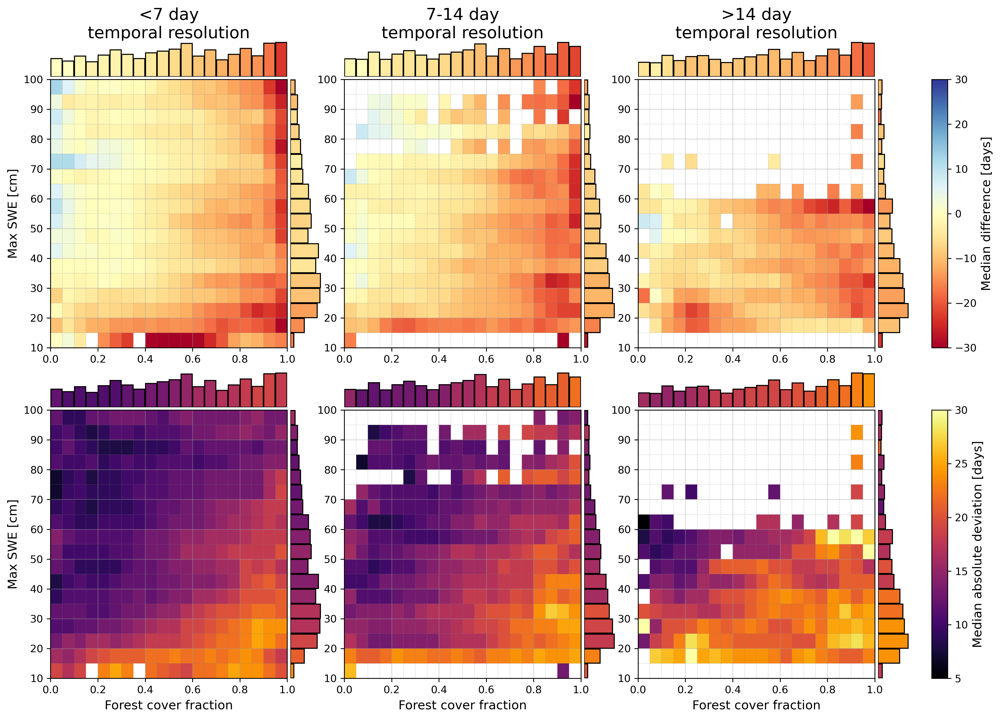

: 

In [ ]:
# Create faceted grid by temporal resolution with SWE as y-axis
import importlib
import station_plots
importlib.reload(station_plots)
from station_plots import median_absolute_deviation
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import GridSpec
from matplotlib.colors import Normalize

min_count = 1000
# Prepare data with SWE in cm and temporal resolution categories
df_facet = df_temp.copy()
df_facet['max_swe_cm'] = df_swe['max_swe'] * 100  # Convert m to cm
df_facet['fcf'] = df_facet['fcf'] / 100  # Convert FCF to fraction

# Create temporal resolution category column
def categorize_temporal_res(temp_res):
    if temp_res < 7:
        return 'Temporal < 7 days'
    elif temp_res < 14:
        return '7-14 days'
    else:
        return 'Temporal ≥ 14 days'

df_facet['temporal_category'] = df_facet['temporal_resolution'].apply(categorize_temporal_res)

categories = ['Temporal < 7 days', '7-14 days', 'Temporal ≥ 14 days']
temp_ranges = ['< 7 days', '7-14 days', '≥ 14 days']

# Print sample sizes
print("Sample sizes by temporal resolution category:")
for cat in categories:
    count = len(df_facet[df_facet['temporal_category'] == cat])
    print(f"{cat}: {count:,} data points")

# Create the main figure with custom gridspec
fig = plt.figure(figsize=(16,12),dpi=300)

# Define gridspec: 7 rows × 11 columns to accommodate joint plots + colorbars + column titles
gs = GridSpec(7, 11, figure=fig,
              width_ratios=[3, 0.4, 0.2, 3, 0.4, 0.2, 3, 0.4, 0.2, 0.2, 0.3],
              height_ratios=[0.3, 0.4, 3, 0.2, 0.4, 3, 0.2],
              hspace=0.03, wspace=0.04)

# Function to create a single joint plot in the grid
def create_joint_plot_in_grid(data, row_start, col_start, reduce_func, cmap, vmin, vmax, title, cbar_label):
    """Create a joint plot within the larger gridspec"""
    
    # Define bin edges - FCF vs SWE now
    x_bins = np.arange(0, 1.01, 0.05)  # 5% FCF bins
    y_bins = np.arange(10, 101, 5)  # 5cm SWE bins from 10cm to 100cm
    
    # Main plot position
    ax_main = fig.add_subplot(gs[row_start:row_start+1, col_start:col_start+1])
    
    # Marginal plot positions
    ax_top = fig.add_subplot(gs[row_start-1:row_start, col_start:col_start+1], sharex=ax_main)
    ax_right = fig.add_subplot(gs[row_start:row_start+1, col_start+1:col_start+2], sharey=ax_main)
    
    # Calculate 2D histogram and reduced C values
    hist_2d, x_edges, y_edges = np.histogram2d(data['fcf'], data['max_swe_cm'], bins=[x_bins, y_bins])
    c_values_2d = np.full(hist_2d.shape, np.nan)
    
    for i in range(len(x_edges) - 1):
        for j in range(len(y_edges) - 1):
            mask = ((data['fcf'] >= x_edges[i]) & (data['fcf'] < x_edges[i + 1]) &
                   (data['max_swe_cm'] >= y_edges[j]) & (data['max_swe_cm'] < y_edges[j + 1]))
            if np.sum(mask) >= min_count:
                c_values_2d[i, j] = reduce_func(data.loc[mask, 'sar_minus_95pct'])
    
    # Plot main 2D histogram
    im = ax_main.pcolormesh(x_edges, y_edges, c_values_2d.T, cmap=cmap, vmin=vmin, vmax=vmax, alpha=1)
    ax_main.set_title(title, fontsize=14, pad=10)
    ax_main.grid(True, alpha=0.3)
    # draw dashed lines for 2d hist bins
    for x_edge in x_edges:
        ax_main.axvline(x_edge, color='gray', linestyle='--', linewidth=0.5, alpha=0.3)
    for y_edge in y_edges:
        ax_main.axhline(y_edge, color='gray', linestyle='--', linewidth=0.5, alpha=0.3)
    
    ax_main.set_xlim(0, 1.0)
    ax_main.set_ylim(10, 100)
    
    # Calculate marginal histograms with colors
    norm = Normalize(vmin=vmin, vmax=vmax)
    
    # X marginal (top) - FCF distribution
    x_hist_counts, x_bin_edges = np.histogram(data['fcf'], bins=x_bins)
    x_bin_centers = (x_bin_edges[:-1] + x_bin_edges[1:]) / 2
    x_c_values = []
    
    for i in range(len(x_bin_edges) - 1):
        mask_x = (data['fcf'] >= x_bin_edges[i]) & (data['fcf'] < x_bin_edges[i + 1])
        if np.sum(mask_x) >= min_count:
            x_c_values.append(reduce_func(data.loc[mask_x, 'sar_minus_95pct']))
        else:
            x_c_values.append(np.nan)
    
    valid_x = ~np.isnan(x_c_values)
    if np.any(valid_x):
        ax_top.bar(x_bin_centers[valid_x], x_hist_counts[valid_x],
                   width=np.diff(x_bin_edges)[0] * 0.95,
                   color=plt.cm.get_cmap(cmap)(norm(np.array(x_c_values)[valid_x])),
                   alpha=1.0, edgecolor='black')
    
    # Y marginal (right) - SWE distribution
    y_hist_counts, y_bin_edges = np.histogram(data['max_swe_cm'], bins=y_bins)
    y_bin_centers = (y_bin_edges[:-1] + y_bin_edges[1:]) / 2
    y_c_values = []
    
    for i in range(len(y_bin_edges) - 1):
        mask_y = (data['max_swe_cm'] >= y_bin_edges[i]) & (data['max_swe_cm'] < y_bin_edges[i + 1])
        if np.sum(mask_y) >= min_count:
            y_c_values.append(reduce_func(data.loc[mask_y, 'sar_minus_95pct']))
        else:
            y_c_values.append(np.nan)
    
    valid_y = ~np.isnan(y_c_values)
    if np.any(valid_y):
        ax_right.barh(y_bin_centers[valid_y], y_hist_counts[valid_y],
                      height=np.diff(y_bin_edges)[0] * 0.95,
                      color=plt.cm.get_cmap(cmap)(norm(np.array(y_c_values)[valid_y])),
                      alpha=1, edgecolor='black')
    
    # Clean up marginal plots
    ax_top.tick_params(labelbottom=False, labeltop=False, labelleft=False, labelright=False,
                       bottom=False, top=False, left=False, right=False)
    ax_right.tick_params(labelbottom=False, labeltop=False, labelleft=False, labelright=False,
                         bottom=False, top=False, left=False, right=False)
    
    for spine in ax_top.spines.values():
        spine.set_visible(False)
    for spine in ax_right.spines.values():
        spine.set_visible(False)
    
    return im, ax_main

# Add column titles
column_titles = ['<7 day\ntemporal resolution', '7-14 day\ntemporal resolution', '>14 day\ntemporal resolution']
for col_idx, col_title in enumerate(column_titles):
    col_start = col_idx * 3
    ax_title = fig.add_subplot(gs[0:1, col_start:col_start+1])
    ax_title.text(0.5, 0.5, col_title, fontsize=16, 
                  ha='center', va='center', transform=ax_title.transAxes)
    ax_title.axis('off')

# Create all joint plots
plot_configs = [
    # Top row (Median difference) - adjusted row_start for new gridspec
    {'reduce_func': np.mean, 'cmap': 'RdYlBu', 'vmin': -30, 'vmax': 30, 'row_start': 2, 'label': 'Median Difference [days]'},
    # Bottom row (MAD) - adjusted row_start for new gridspec
    {'reduce_func': median_absolute_deviation, 'cmap': 'inferno', 'vmin': 5, 'vmax': 30, 'row_start': 5, 'label': 'MAD [days]'}
]

# Store mappables for colorbars
mappables = {'median': None, 'mad': None}

for row_idx, config in enumerate(plot_configs):
    row_name = 'median' if row_idx == 0 else 'mad'
    
    for col_idx, (cat, temp_range) in enumerate(zip(categories, temp_ranges)):
        cat_data = df_facet[df_facet['temporal_category'] == cat].copy()
        
        if len(cat_data) < 1000:
            print(f"Skipping {cat} - insufficient data ({len(cat_data)} points)")
            continue
        
        print(f"Processing {cat}: {len(cat_data):,} data points")
        
        # Column positions: 0, 3, 6 for the three temporal resolution ranges
        col_start = col_idx * 3
        
        # Create title
        metric_name = "Median Difference" if row_idx == 0 else "MAD"
        title = f"{metric_name} - {temp_range}"
        
        # Create joint plot
        im, ax_main = create_joint_plot_in_grid(
            cat_data, config['row_start'], col_start, 
            config['reduce_func'], config['cmap'], 
            config['vmin'], config['vmax'], title, config['label']
        )
        
        # Store first mappable for colorbar
        if mappables[row_name] is None:
            mappables[row_name] = im
        
        # Add axis labels only for leftmost and bottom plots
        if col_idx == 0:  # Leftmost column
            ax_main.set_ylabel('Max SWE [cm]', fontsize=12)
        else:
            ax_main.set_ylabel('')
            
        if row_idx == 1:  # Bottom row
            ax_main.set_xlabel('Forest cover fraction', fontsize=12)
        else:
            ax_main.set_xlabel('')

# Add colorbars on the right side - adjusted for new gridspec
if mappables['median'] is not None:
    cbar_ax1 = fig.add_subplot(gs[2:3, 9:10])  # Top colorbar
    cbar1 = plt.colorbar(mappables['median'], cax=cbar_ax1, orientation='vertical')
    cbar1.set_label('Median difference [days]', fontsize=12)

if mappables['mad'] is not None:
    cbar_ax2 = fig.add_subplot(gs[5:6, 9:10])  # Bottom colorbar  
    cbar2 = plt.colorbar(mappables['mad'], cax=cbar_ax2, orientation='vertical')
    cbar2.set_label('Median absolute deviation [days]', fontsize=12)


Sample sizes by temporal resolution category:
Temporal < 7 days: 3,038,743 data points
7-14 days: 1,331,046 data points
Temporal ≥ 14 days: 606,195 data points
Processing Temporal < 7 days: 3,038,743 data points (Row: median)
Processing 7-14 days: 1,331,046 data points (Row: median)
Processing Temporal ≥ 14 days: 606,195 data points (Row: median)
Processing Temporal < 7 days: 3,038,743 data points (Row: mad)
Processing 7-14 days: 1,331,046 data points (Row: mad)
Processing Temporal ≥ 14 days: 606,195 data points (Row: mad)
Processing Temporal < 7 days: 3,038,743 data points (Row: count)
Processing 7-14 days: 1,331,046 data points (Row: count)
Processing Temporal ≥ 14 days: 606,195 data points (Row: count)


/tmp/ipykernel_69061/1720019269.py:174: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


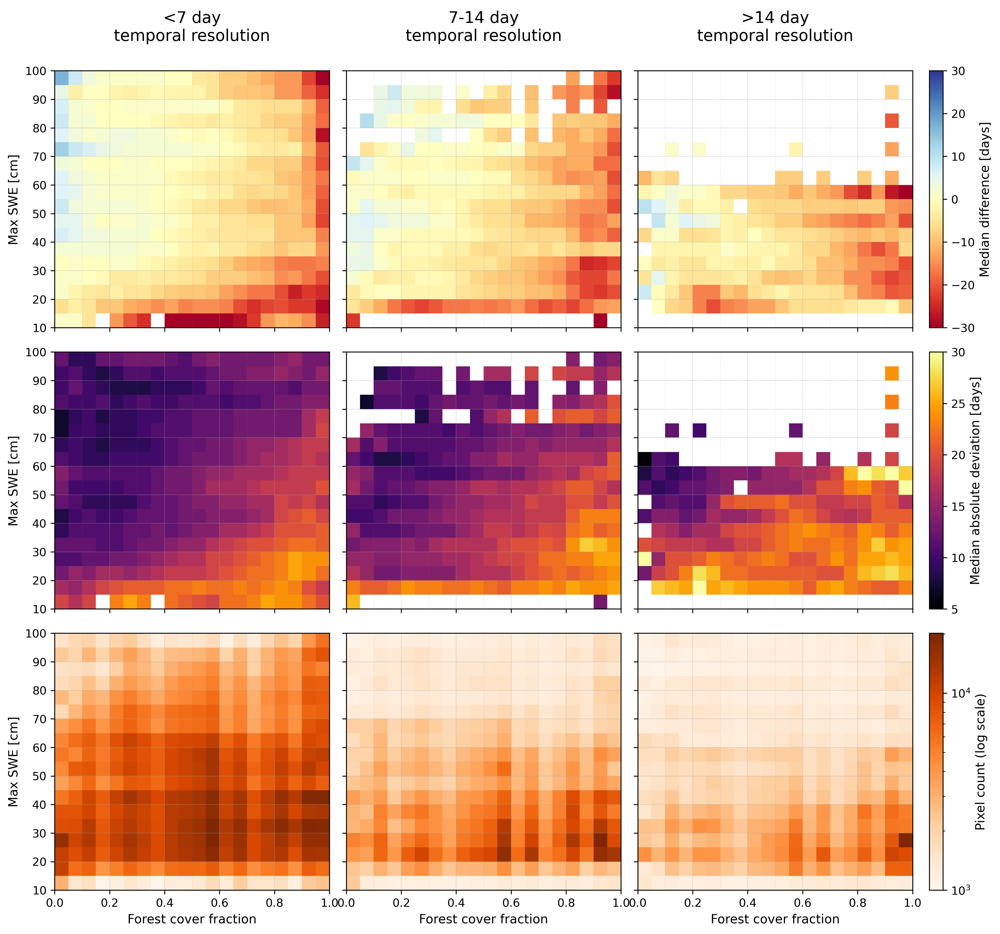

In [34]:
# Create faceted grid by temporal resolution with SWE as y-axis - no marginals, add count row
import importlib
import station_plots
importlib.reload(station_plots)
from station_plots import median_absolute_deviation
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import GridSpec
from matplotlib.colors import Normalize, LogNorm

min_count = 1000
# Prepare data with SWE in cm and temporal resolution categories
df_facet = df_temp.copy()
df_facet['max_swe_cm'] = df_swe['max_swe'] * 100  # Convert m to cm
df_facet['fcf'] = df_facet['fcf'] / 100  # Convert FCF to fraction

# Create temporal resolution category column
def categorize_temporal_res(temp_res):
    if temp_res < 7:
        return 'Temporal < 7 days'
    elif temp_res < 14:
        return '7-14 days'
    else:
        return 'Temporal ≥ 14 days'

df_facet['temporal_category'] = df_facet['temporal_resolution'].apply(categorize_temporal_res)

categories = ['Temporal < 7 days', '7-14 days', 'Temporal ≥ 14 days']
temp_ranges = ['< 7 days', '7-14 days', '≥ 14 days']

# Print sample sizes
print("Sample sizes by temporal resolution category:")
for cat in categories:
    count = len(df_facet[df_facet['temporal_category'] == cat])
    print(f"{cat}: {count:,} data points")

# Create the main figure with custom gridspec
fig = plt.figure(figsize=(14, 14), dpi=300)

# Define gridspec: 4 rows × 4 columns (3 plots + 1 colorbar per row)
gs = GridSpec(4, 4, figure=fig,
              width_ratios=[1, 1, 1, 0.05],  # 3 equal plot columns + narrow colorbar column
              height_ratios=[0.15, 1, 1, 1],  # Title row + 3 plot rows
              hspace=0.12, wspace=0.08)

# Function to create a single 2D histogram plot (no marginals)
def create_2d_hist_in_grid(data, row_idx, col_idx, reduce_func, cmap, vmin, vmax, title):
    """Create a 2D histogram within the larger gridspec"""
    
    # Define bin edges - FCF vs SWE
    x_bins = np.arange(0, 1.01, 0.05)  # 5% FCF bins
    y_bins = np.arange(10, 101, 5)  # 5cm SWE bins from 10cm to 100cm
    
    # Main plot position
    ax = fig.add_subplot(gs[row_idx, col_idx])
    
    # Calculate 2D histogram and reduced C values
    hist_2d, x_edges, y_edges = np.histogram2d(data['fcf'], data['max_swe_cm'], bins=[x_bins, y_bins])
    
    if reduce_func is None:  # Count row
        c_values_2d = hist_2d
    else:
        c_values_2d = np.full(hist_2d.shape, np.nan)
        for i in range(len(x_edges) - 1):
            for j in range(len(y_edges) - 1):
                mask = ((data['fcf'] >= x_edges[i]) & (data['fcf'] < x_edges[i + 1]) &
                       (data['max_swe_cm'] >= y_edges[j]) & (data['max_swe_cm'] < y_edges[j + 1]))
                if np.sum(mask) >= min_count:
                    c_values_2d[i, j] = reduce_func(data.loc[mask, 'sar_minus_95pct'])
    
    # Plot 2D histogram
    im = ax.pcolormesh(x_edges, y_edges, c_values_2d.T, cmap=cmap, vmin=vmin, vmax=vmax, alpha=1)
    
    ax.set_title("")
    ax.grid(True, alpha=0.3, linewidth=0.5)
    
    # Draw bin lines
    for x_edge in x_edges[::2]:  # Every other line to reduce clutter
        ax.axvline(x_edge, color='gray', linestyle='--', linewidth=0.3, alpha=0.2)
    for y_edge in y_edges[::2]:
        ax.axhline(y_edge, color='gray', linestyle='--', linewidth=0.3, alpha=0.2)
    
    ax.set_xlim(0, 1.0)
    ax.set_ylim(10, 100)
    
    # Add axis labels only for leftmost and bottom plots
    if col_idx == 0:  # Leftmost column
        ax.set_ylabel('Max SWE [cm]', fontsize=11)
    else:
        ax.set_ylabel('')
        ax.tick_params(labelleft=False)
        
    if row_idx == 3:  # Bottom row
        ax.set_xlabel('Forest cover fraction', fontsize=11)
    else:
        ax.set_xlabel('')
        ax.tick_params(labelbottom=False)
    
    return im, ax

# Add column titles
column_titles = ['<7 day\ntemporal resolution', '7-14 day\ntemporal resolution', '>14 day\ntemporal resolution']
for col_idx, col_title in enumerate(column_titles):
    ax_title = fig.add_subplot(gs[0, col_idx])
    ax_title.text(0.5, 0.5, col_title, fontsize=14, 
                  ha='center', va='center', transform=ax_title.transAxes)
    ax_title.axis('off')

# Create all plots
plot_configs = [
    # Row 1: Median difference
    {'reduce_func': np.median, 'cmap': 'RdYlBu', 'vmin': -30, 'vmax': 30, 'row_idx': 1, 
     'label': 'Median difference [days]', 'row_name': 'median'},
    # Row 2: MAD
    {'reduce_func': median_absolute_deviation, 'cmap': 'inferno', 'vmin': 5, 'vmax': 30, 'row_idx': 2,
     'label': 'Median absolute deviation [days]', 'row_name': 'mad'},
    # Row 3: Count (with log scale)
    {'reduce_func': None, 'cmap': 'Oranges', 'vmin': 1, 'vmax': None, 'row_idx': 3,
     'label': 'Pixel count (log scale)', 'row_name': 'count'}
]

# Store mappables for colorbars
mappables = {'median': None, 'mad': None, 'count': None}

for config in plot_configs:
    row_name = config['row_name']
    
    for col_idx, (cat, temp_range) in enumerate(zip(categories, temp_ranges)):
        cat_data = df_facet[df_facet['temporal_category'] == cat].copy()
        
        if len(cat_data) < 1000:
            print(f"Skipping {cat} - insufficient data ({len(cat_data)} points)")
            continue
        
        print(f"Processing {cat}: {len(cat_data):,} data points (Row: {row_name})")
        
        # Create title
        if row_name == 'median':
            metric_name = "Median Difference"
        elif row_name == 'mad':
            metric_name = "MAD"
        else:
            metric_name = "Count"
        
        title = f""
        
        # Create 2D histogram plot
        im, ax = create_2d_hist_in_grid(
            cat_data, config['row_idx'], col_idx,
            config['reduce_func'], config['cmap'], 
            config['vmin'], config['vmax'], title
        )
        
        # Store first mappable for colorbar
        if mappables[row_name] is None:
            mappables[row_name] = im
            # Apply log normalization for count row
            if row_name == 'count':
                im.set_norm(LogNorm(vmin=min_count, vmax=im.get_array().max()))

# Add colorbars on the right side
for idx, (key, mappable) in enumerate(mappables.items()):
    if mappable is not None:
        cbar_ax = fig.add_subplot(gs[idx + 1, 3])
        cbar = plt.colorbar(mappable, cax=cbar_ax, orientation='vertical')
        
        if key == 'median':
            cbar.set_label('Median difference [days]', fontsize=11)
        elif key == 'mad':
            cbar.set_label('Median absolute deviation [days]', fontsize=11)
        else:
            cbar.set_label('Pixel count (log scale)', fontsize=11)

plt.tight_layout()

Sample sizes by temporal resolution category:
Temporal < 7 days: 3,038,743 data points
7-14 days: 1,331,046 data points
Temporal ≥ 14 days: 606,195 data points
Processing Temporal < 7 days: 3,038,743 data points (Row: median)
Processing 7-14 days: 1,331,046 data points (Row: median)
Processing Temporal ≥ 14 days: 606,195 data points (Row: median)
Processing Temporal < 7 days: 3,038,743 data points (Row: mad)
Processing 7-14 days: 1,331,046 data points (Row: mad)
Processing Temporal ≥ 14 days: 606,195 data points (Row: mad)
Processing Temporal < 7 days: 3,038,743 data points (Row: count)
Processing 7-14 days: 1,331,046 data points (Row: count)
Processing Temporal ≥ 14 days: 606,195 data points (Row: count)


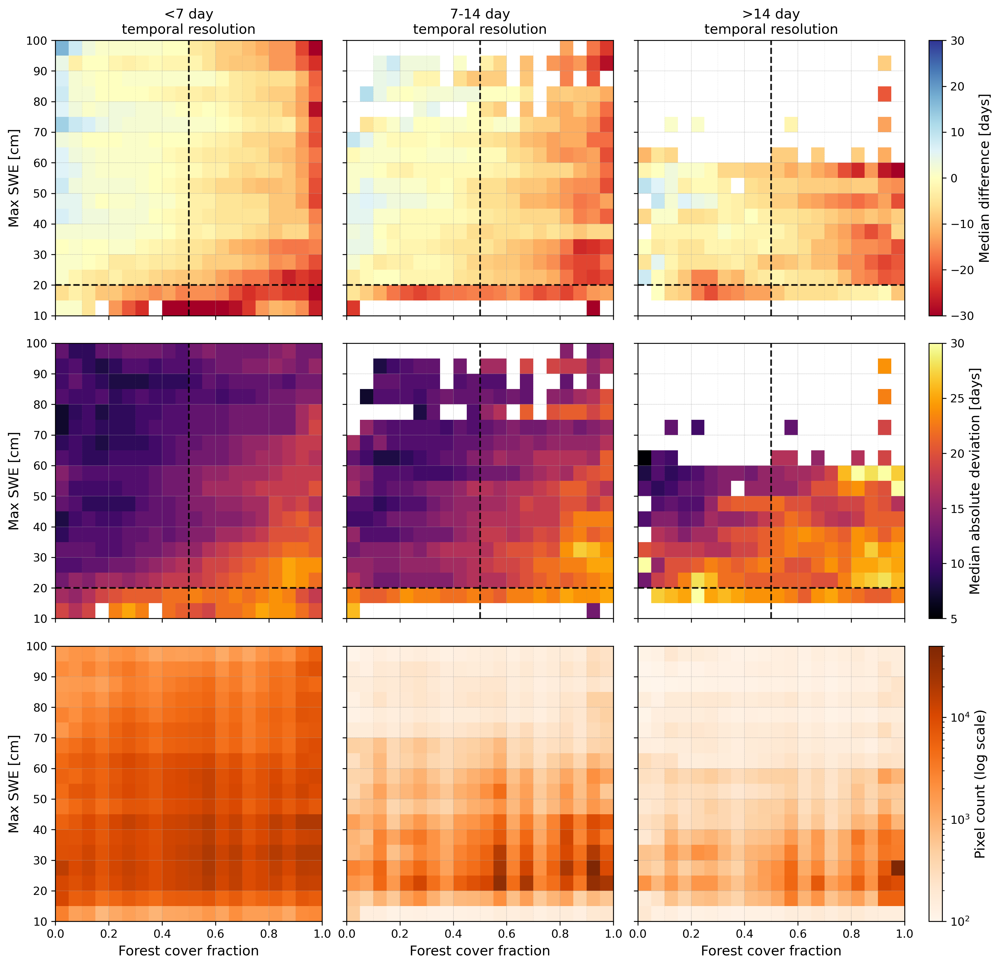

In [41]:
# Create faceted grid by temporal resolution with SWE as y-axis - no marginals, add count row
import importlib
import station_plots
importlib.reload(station_plots)
from station_plots import median_absolute_deviation
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import GridSpec
from matplotlib.colors import Normalize, LogNorm

min_count = 1000
# Prepare data with SWE in cm and temporal resolution categories
df_facet = df_temp.copy()
df_facet['max_swe_cm'] = df_swe['max_swe'] * 100  # Convert m to cm
df_facet['fcf'] = df_facet['fcf'] / 100  # Convert FCF to fraction

# Create temporal resolution category column
def categorize_temporal_res(temp_res):
    if temp_res < 7:
        return 'Temporal < 7 days'
    elif temp_res < 14:
        return '7-14 days'
    else:
        return 'Temporal ≥ 14 days'

df_facet['temporal_category'] = df_facet['temporal_resolution'].apply(categorize_temporal_res)

categories = ['Temporal < 7 days', '7-14 days', 'Temporal ≥ 14 days']
temp_ranges = ['< 7 days', '7-14 days', '≥ 14 days']

# Print sample sizes
print("Sample sizes by temporal resolution category:")
for cat in categories:
    count = len(df_facet[df_facet['temporal_category'] == cat])
    print(f"{cat}: {count:,} data points")

# Create the main figure with custom gridspec
fig = plt.figure(figsize=(14, 14), dpi=300)

# Define gridspec: 3 rows × 4 columns (3 plots + 1 colorbar per row)
gs = GridSpec(3, 4, figure=fig,
              width_ratios=[1, 1, 1, 0.05],  # 3 equal plot columns + narrow colorbar column
              height_ratios=[1, 1, 1],  # 3 equal plot rows
              hspace=0.1, wspace=0.12)

# Function to create a single 2D histogram plot (no marginals)
def create_2d_hist_in_grid(data, row_idx, col_idx, reduce_func, cmap, vmin, vmax, title):
    """Create a 2D histogram within the larger gridspec"""
    
    # Define bin edges - FCF vs SWE
    x_bins = np.arange(0, 1.01, 0.05)  # 5% FCF bins
    y_bins = np.arange(10, 101, 5)  # 5cm SWE bins from 10cm to 100cm
    
    # Main plot position
    ax = fig.add_subplot(gs[row_idx, col_idx])
    
    # Calculate 2D histogram and reduced C values
    hist_2d, x_edges, y_edges = np.histogram2d(data['fcf'], data['max_swe_cm'], bins=[x_bins, y_bins])
    
    if reduce_func is None:  # Count row
        c_values_2d = hist_2d
    else:
        c_values_2d = np.full(hist_2d.shape, np.nan)
        for i in range(len(x_edges) - 1):
            for j in range(len(y_edges) - 1):
                mask = ((data['fcf'] >= x_edges[i]) & (data['fcf'] < x_edges[i + 1]) &
                       (data['max_swe_cm'] >= y_edges[j]) & (data['max_swe_cm'] < y_edges[j + 1]))
                if np.sum(mask) >= min_count:
                    c_values_2d[i, j] = reduce_func(data.loc[mask, 'sar_minus_95pct'])
    
    # Plot 2D histogram
    im = ax.pcolormesh(x_edges, y_edges, c_values_2d.T, cmap=cmap, vmin=vmin, vmax=vmax, alpha=1)
    
    ax.set_title(title, fontsize=12)
    ax.grid(True, alpha=0.3, linewidth=0.5)
    
    # Draw bin lines
    for x_edge in x_edges[::2]:  # Every other line to reduce clutter
        ax.axvline(x_edge, color='gray', linestyle='--', linewidth=0.3, alpha=0.2)
    for y_edge in y_edges[::2]:
        ax.axhline(y_edge, color='gray', linestyle='--', linewidth=0.3, alpha=0.2)
    
    # Add reference lines for median/MAD plots (not count row)
    if reduce_func is not None:
        ax.axvline(0.5, color='black', linestyle='--', linewidth=1.5, alpha=0.9)
        ax.axhline(20, color='black', linestyle='--', linewidth=1.5, alpha=0.9)
    
    ax.set_xlim(0, 1.0)
    ax.set_ylim(10, 100)
    
    # Add axis labels only for leftmost and bottom plots
    if col_idx == 0:  # Leftmost column
        ax.set_ylabel('Max SWE [cm]', fontsize=12)
    else:
        ax.set_ylabel('')
        ax.tick_params(labelleft=False)
        
    if row_idx == 2:  # Bottom row
        ax.set_xlabel('Forest cover fraction', fontsize=12)
    else:
        ax.set_xlabel('')
        ax.tick_params(labelbottom=False)
    
    return im, ax

# Column titles for top row plots
column_titles = ['<7 day\ntemporal resolution', '7-14 day\ntemporal resolution', '>14 day\ntemporal resolution']

# Create all plots
plot_configs = [
    # Row 0: Median difference
    {'reduce_func': np.median, 'cmap': 'RdYlBu', 'vmin': -30, 'vmax': 30, 'row_idx': 0, 
     'label': 'Median difference [days]', 'row_name': 'median'},
    # Row 1: MAD
    {'reduce_func': median_absolute_deviation, 'cmap': 'inferno', 'vmin': 5, 'vmax': 30, 'row_idx': 1,
     'label': 'Median absolute deviation [days]', 'row_name': 'mad'},
    # Row 2: Count (with log scale)
    {'reduce_func': None, 'cmap': 'Oranges', 'vmin': 100, 'vmax': None, 'row_idx': 2,
     'label': 'Pixel count (log scale)', 'row_name': 'count'}
]

# Store mappables for colorbars
mappables = {'median': None, 'mad': None, 'count': None}

for config in plot_configs:
    row_name = config['row_name']
    
    for col_idx, (cat, temp_range) in enumerate(zip(categories, temp_ranges)):
        cat_data = df_facet[df_facet['temporal_category'] == cat].copy()
        
        if len(cat_data) < 1000:
            print(f"Skipping {cat} - insufficient data ({len(cat_data)} points)")
            continue
        
        print(f"Processing {cat}: {len(cat_data):,} data points (Row: {row_name})")
        
        # Set title only for top row
        if config['row_idx'] == 0:
            title = column_titles[col_idx]
        else:
            title = ""
        
        # Create 2D histogram plot
        im, ax = create_2d_hist_in_grid(
            cat_data, config['row_idx'], col_idx,
            config['reduce_func'], config['cmap'], 
            config['vmin'], config['vmax'], title
        )
        
        # Store first mappable for colorbar
        if mappables[row_name] is None:
            mappables[row_name] = im
            # Apply log normalization for count row
            if row_name == 'count':
                im.set_norm(LogNorm(vmin=100, vmax=50000))

# Add colorbars on the right side
for idx, (key, mappable) in enumerate(mappables.items()):
    if mappable is not None:
        cbar_ax = fig.add_subplot(gs[idx, 3])
        cbar = plt.colorbar(mappable, cax=cbar_ax, orientation='vertical')
        
        if key == 'median':
            cbar.set_label('Median difference [days]', fontsize=12)
        elif key == 'mad':
            cbar.set_label('Median absolute deviation [days]', fontsize=12)
        else:
            cbar.set_label('Pixel count (log scale)', fontsize=12)

#plt.tight_layout()

Sample sizes by temporal resolution category:
Temporal < 7 days: 3,038,743 data points
7-14 days: 1,331,046 data points
Temporal ≥ 14 days: 606,195 data points
Processing Temporal < 7 days: 3,038,743 data points (Row: median)
Processing 7-14 days: 1,331,046 data points (Row: median)
Processing Temporal ≥ 14 days: 606,195 data points (Row: median)
Processing Temporal < 7 days: 3,038,743 data points (Row: mad)
Processing 7-14 days: 1,331,046 data points (Row: mad)
Processing Temporal ≥ 14 days: 606,195 data points (Row: mad)


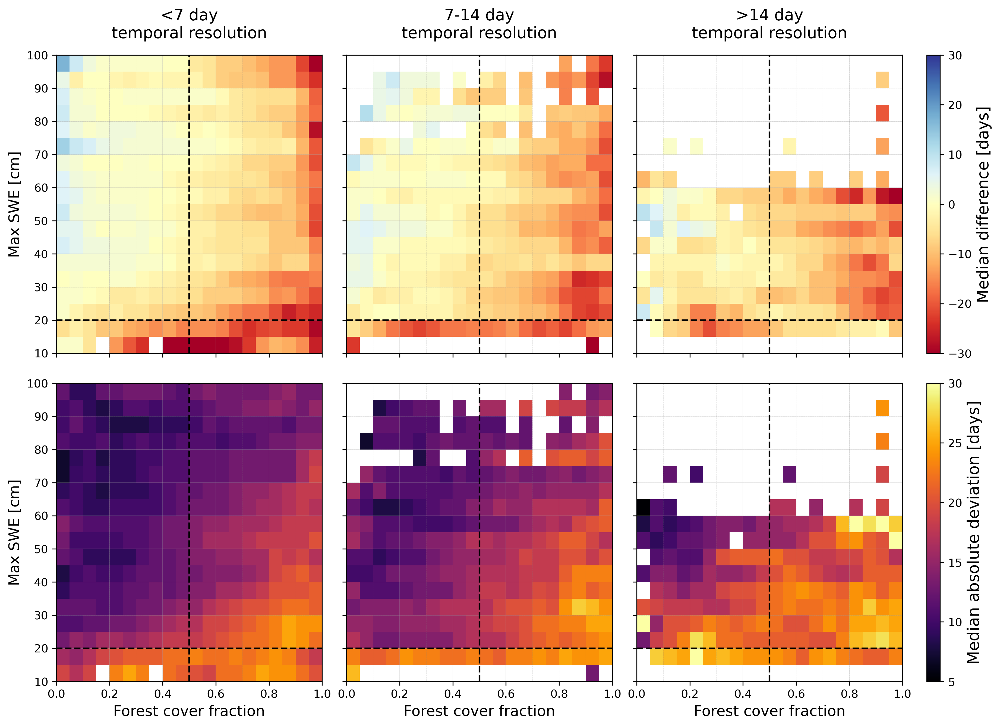

In [44]:
# Create faceted grid by temporal resolution with SWE as y-axis - no marginals, median and MAD only
import importlib
import station_plots
importlib.reload(station_plots)
from station_plots import median_absolute_deviation
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import GridSpec
from matplotlib.colors import Normalize

min_count = 1000
# Prepare data with SWE in cm and temporal resolution categories
df_facet = df_temp.copy()
df_facet['max_swe_cm'] = df_swe['max_swe'] * 100  # Convert m to cm
df_facet['fcf'] = df_facet['fcf'] / 100  # Convert FCF to fraction

# Create temporal resolution category column
def categorize_temporal_res(temp_res):
    if temp_res < 7:
        return 'Temporal < 7 days'
    elif temp_res < 14:
        return '7-14 days'
    else:
        return 'Temporal ≥ 14 days'

df_facet['temporal_category'] = df_facet['temporal_resolution'].apply(categorize_temporal_res)

categories = ['Temporal < 7 days', '7-14 days', 'Temporal ≥ 14 days']
temp_ranges = ['< 7 days', '7-14 days', '≥ 14 days']

# Print sample sizes
print("Sample sizes by temporal resolution category:")
for cat in categories:
    count = len(df_facet[df_facet['temporal_category'] == cat])
    print(f"{cat}: {count:,} data points")

# Create the main figure with custom gridspec
fig = plt.figure(figsize=(14, 10), dpi=300)

# Define gridspec: 2 rows × 4 columns (3 plots + 1 colorbar per row)
gs = GridSpec(2, 4, figure=fig,
              width_ratios=[1, 1, 1, 0.05],  # 3 equal plot columns + narrow colorbar column
              height_ratios=[1, 1],  # 2 equal plot rows
              hspace=0.1, wspace=0.12)

# Function to create a single 2D histogram plot (no marginals)
def create_2d_hist_in_grid(data, row_idx, col_idx, reduce_func, cmap, vmin, vmax, title):
    """Create a 2D histogram within the larger gridspec"""
    
    # Define bin edges - FCF vs SWE
    x_bins = np.arange(0, 1.01, 0.05)  # 5% FCF bins
    y_bins = np.arange(10, 101, 5)  # 5cm SWE bins from 10cm to 100cm
    
    # Main plot position
    ax = fig.add_subplot(gs[row_idx, col_idx])
    
    # Calculate 2D histogram and reduced C values
    hist_2d, x_edges, y_edges = np.histogram2d(data['fcf'], data['max_swe_cm'], bins=[x_bins, y_bins])
    
    c_values_2d = np.full(hist_2d.shape, np.nan)
    for i in range(len(x_edges) - 1):
        for j in range(len(y_edges) - 1):
            mask = ((data['fcf'] >= x_edges[i]) & (data['fcf'] < x_edges[i + 1]) &
                   (data['max_swe_cm'] >= y_edges[j]) & (data['max_swe_cm'] < y_edges[j + 1]))
            if np.sum(mask) >= min_count:
                c_values_2d[i, j] = reduce_func(data.loc[mask, 'sar_minus_95pct'])
    
    # Plot 2D histogram
    im = ax.pcolormesh(x_edges, y_edges, c_values_2d.T, cmap=cmap, vmin=vmin, vmax=vmax, alpha=1)
    
    ax.set_title(title, fontsize=14, pad=15)
    ax.grid(True, alpha=0.3, linewidth=0.5)
    
    # Draw bin lines
    for x_edge in x_edges[::2]:  # Every other line to reduce clutter
        ax.axvline(x_edge, color='gray', linestyle='--', linewidth=0.3, alpha=0.2)
    for y_edge in y_edges[::2]:
        ax.axhline(y_edge, color='gray', linestyle='--', linewidth=0.3, alpha=0.2)
    
    # Add reference lines
    ax.axvline(0.5, color='black', linestyle='--', linewidth=1.5, alpha=1)
    ax.axhline(20, color='black', linestyle='--', linewidth=1.5, alpha=1)
    
    ax.set_xlim(0, 1.0)
    ax.set_ylim(10, 100)
    
    # Add axis labels only for leftmost and bottom plots
    if col_idx == 0:  # Leftmost column
        ax.set_ylabel('Max SWE [cm]', fontsize=13)
    else:
        ax.set_ylabel('')
        ax.tick_params(labelleft=False)
        
    if row_idx == 1:  # Bottom row
        ax.set_xlabel('Forest cover fraction', fontsize=13)
    else:
        ax.set_xlabel('')
        ax.tick_params(labelbottom=False)
    
    return im, ax

# Column titles for top row plots
column_titles = ['<7 day\ntemporal resolution', '7-14 day\ntemporal resolution', '>14 day\ntemporal resolution']

# Create all plots
plot_configs = [
    # Row 0: Median difference
    {'reduce_func': np.median, 'cmap': 'RdYlBu', 'vmin': -30, 'vmax': 30, 'row_idx': 0, 
     'label': 'Median difference [days]', 'row_name': 'median'},
    # Row 1: MAD
    {'reduce_func': median_absolute_deviation, 'cmap': 'inferno', 'vmin': 5, 'vmax': 30, 'row_idx': 1,
     'label': 'Median absolute deviation [days]', 'row_name': 'mad'}
]

# Store mappables for colorbars
mappables = {'median': None, 'mad': None}

for config in plot_configs:
    row_name = config['row_name']
    
    for col_idx, (cat, temp_range) in enumerate(zip(categories, temp_ranges)):
        cat_data = df_facet[df_facet['temporal_category'] == cat].copy()
        
        if len(cat_data) < 1000:
            print(f"Skipping {cat} - insufficient data ({len(cat_data)} points)")
            continue
        
        print(f"Processing {cat}: {len(cat_data):,} data points (Row: {row_name})")
        
        # Set title only for top row
        if config['row_idx'] == 0:
            title = column_titles[col_idx]
        else:
            title = ""
        
        # Create 2D histogram plot
        im, ax = create_2d_hist_in_grid(
            cat_data, config['row_idx'], col_idx,
            config['reduce_func'], config['cmap'], 
            config['vmin'], config['vmax'], title
        )
        
        # Store first mappable for colorbar
        if mappables[row_name] is None:
            mappables[row_name] = im

# Add colorbars on the right side
for idx, (key, mappable) in enumerate(mappables.items()):
    if mappable is not None:
        cbar_ax = fig.add_subplot(gs[idx, 3])
        cbar = plt.colorbar(mappable, cax=cbar_ax, orientation='vertical')
        
        if key == 'median':
            cbar.set_label('Median difference [days]', fontsize=14)
        elif key == 'mad':
            cbar.set_label('Median absolute deviation [days]', fontsize=14)



Sample sizes by temporal resolution category:
0-10 days: 3,534,241 data points
10-20 days: 1,080,434 data points
20-30 days: 361,309 data points
0-10 days: 3,534,241 data points
10-20 days: 1,080,434 data points
20-30 days: 361,309 data points
Processing 0-10 days: 3,534,241 data points
Processing 0-10 days: 3,534,241 data points


/tmp/ipykernel_489165/739665843.py:104: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color=plt.cm.get_cmap(cmap)(norm(np.array(x_c_values)[valid_x])),
/tmp/ipykernel_489165/739665843.py:123: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  color=plt.cm.get_cmap(cmap)(norm(np.array(y_c_values)[valid_y])),


Processing 10-20 days: 1,080,434 data points
Processing 20-30 days: 361,309 data points
Processing 20-30 days: 361,309 data points
Processing 0-10 days: 3,534,241 data points
Processing 0-10 days: 3,534,241 data points
Processing 10-20 days: 1,080,434 data points
Processing 10-20 days: 1,080,434 data points
Processing 20-30 days: 361,309 data points
Processing 20-30 days: 361,309 data points


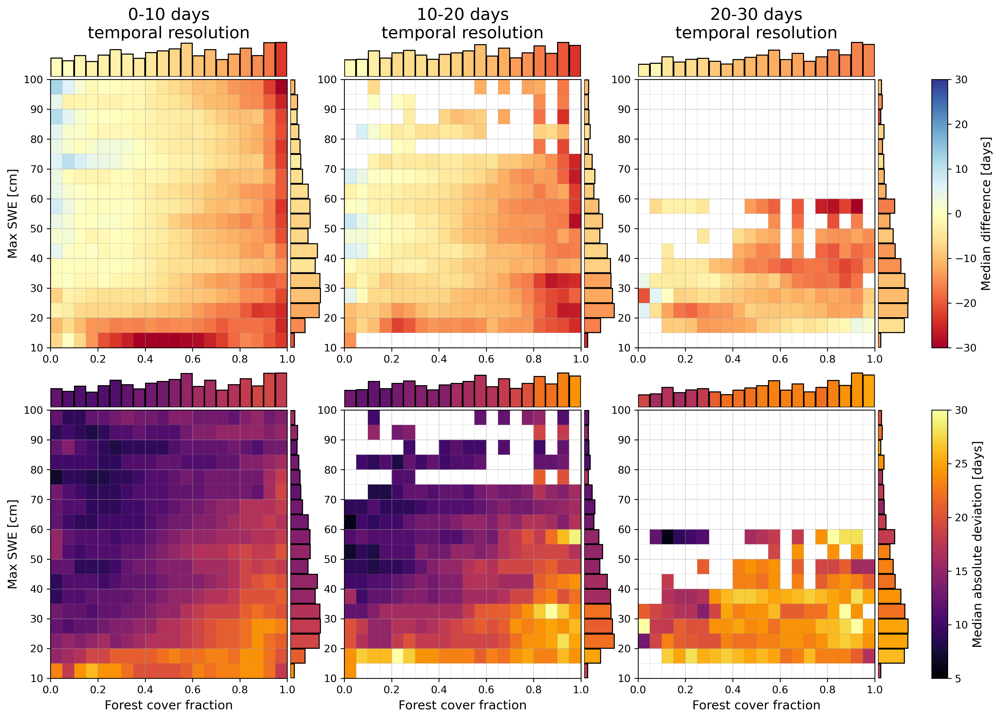

In [ ]:
# Create faceted grid by temporal resolution with SWE as y-axis
import importlib
import station_plots
importlib.reload(station_plots)
from station_plots import median_absolute_deviation
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.gridspec import GridSpec
from matplotlib.colors import Normalize

min_count = 1000
# Prepare data with SWE in cm and temporal resolution categories
df_facet = df_temp.copy()
df_facet['max_swe_cm'] = df_swe['max_swe'] * 100  # Convert m to cm
df_facet['fcf'] = df_facet['fcf'] / 100  # Convert FCF to fraction

# Create temporal resolution category column
def categorize_temporal_res(temp_res):
    if temp_res < 10:
        return '0-10 days'
    elif temp_res < 20:
        return '10-20 days'
    else:
        return '20-30 days'

df_facet['temporal_category'] = df_facet['temporal_resolution'].apply(categorize_temporal_res)

categories = ['0-10 days', '10-20 days', '20-30 days']
temp_ranges = ['0-10 days\ntemporal resolution', '10-20 days\ntemporal resolution', '20-30 days\ntemporal resolution']

# Print sample sizes
print("Sample sizes by temporal resolution category:")
for cat in categories:
    count = len(df_facet[df_facet['temporal_category'] == cat])
    print(f"{cat}: {count:,} data points")

# Create the main figure with custom gridspec
fig = plt.figure(figsize=(16,12),dpi=300)

# Define gridspec: 7 rows × 11 columns to accommodate joint plots + colorbars + column titles
gs = GridSpec(7, 11, figure=fig,
              width_ratios=[3, 0.4, 0.2, 3, 0.4, 0.2, 3, 0.4, 0.2, 0.2, 0.3],
              height_ratios=[0.3, 0.4, 3, 0.2, 0.4, 3, 0.2],
              hspace=0.03, wspace=0.04)

# Function to create a single joint plot in the grid
def create_joint_plot_in_grid(data, row_start, col_start, reduce_func, cmap, vmin, vmax, title, cbar_label):
    """Create a joint plot within the larger gridspec"""
    
    # Define bin edges - FCF vs SWE now
    x_bins = np.arange(0, 1.01, 0.05)  # 5% FCF bins
    y_bins = np.arange(10, 101, 5)  # 5cm SWE bins from 10cm to 100cm
    
    # Main plot position
    ax_main = fig.add_subplot(gs[row_start:row_start+1, col_start:col_start+1])
    
    # Marginal plot positions
    ax_top = fig.add_subplot(gs[row_start-1:row_start, col_start:col_start+1], sharex=ax_main)
    ax_right = fig.add_subplot(gs[row_start:row_start+1, col_start+1:col_start+2], sharey=ax_main)
    
    # Calculate 2D histogram and reduced C values
    hist_2d, x_edges, y_edges = np.histogram2d(data['fcf'], data['max_swe_cm'], bins=[x_bins, y_bins])
    c_values_2d = np.full(hist_2d.shape, np.nan)
    
    for i in range(len(x_edges) - 1):
        for j in range(len(y_edges) - 1):
            mask = ((data['fcf'] >= x_edges[i]) & (data['fcf'] < x_edges[i + 1]) &
                   (data['max_swe_cm'] >= y_edges[j]) & (data['max_swe_cm'] < y_edges[j + 1]))
            if np.sum(mask) >= min_count:
                c_values_2d[i, j] = reduce_func(data.loc[mask, 'sar_minus_95pct'])
    
    # Plot main 2D histogram
    im = ax_main.pcolormesh(x_edges, y_edges, c_values_2d.T, cmap=cmap, vmin=vmin, vmax=vmax, alpha=1)
    ax_main.set_title(title, fontsize=14, pad=10)
    ax_main.grid(True, alpha=0.3)
    # draw dashed lines for 2d hist bins
    for x_edge in x_edges:
        ax_main.axvline(x_edge, color='gray', linestyle='--', linewidth=0.5, alpha=0.3)
    for y_edge in y_edges:
        ax_main.axhline(y_edge, color='gray', linestyle='--', linewidth=0.5, alpha=0.3)
    
    ax_main.set_xlim(0, 1.0)
    ax_main.set_ylim(10, 100)
    
    # Calculate marginal histograms with colors
    norm = Normalize(vmin=vmin, vmax=vmax)
    
    # X marginal (top) - FCF distribution
    x_hist_counts, x_bin_edges = np.histogram(data['fcf'], bins=x_bins)
    x_bin_centers = (x_bin_edges[:-1] + x_bin_edges[1:]) / 2
    x_c_values = []
    
    for i in range(len(x_bin_edges) - 1):
        mask_x = (data['fcf'] >= x_bin_edges[i]) & (data['fcf'] < x_bin_edges[i + 1])
        if np.sum(mask_x) >= min_count:
            x_c_values.append(reduce_func(data.loc[mask_x, 'sar_minus_95pct']))
        else:
            x_c_values.append(np.nan)
    
    valid_x = ~np.isnan(x_c_values)
    if np.any(valid_x):
        ax_top.bar(x_bin_centers[valid_x], x_hist_counts[valid_x],
                   width=np.diff(x_bin_edges)[0] * 0.95,
                   color=plt.cm.get_cmap(cmap)(norm(np.array(x_c_values)[valid_x])),
                   alpha=1.0, edgecolor='black')
    
    # Y marginal (right) - SWE distribution
    y_hist_counts, y_bin_edges = np.histogram(data['max_swe_cm'], bins=y_bins)
    y_bin_centers = (y_bin_edges[:-1] + y_bin_edges[1:]) / 2
    y_c_values = []
    
    for i in range(len(y_bin_edges) - 1):
        mask_y = (data['max_swe_cm'] >= y_bin_edges[i]) & (data['max_swe_cm'] < y_bin_edges[i + 1])
        if np.sum(mask_y) >= min_count:
            y_c_values.append(reduce_func(data.loc[mask_y, 'sar_minus_95pct']))
        else:
            y_c_values.append(np.nan)
    
    valid_y = ~np.isnan(y_c_values)
    if np.any(valid_y):
        ax_right.barh(y_bin_centers[valid_y], y_hist_counts[valid_y],
                      height=np.diff(y_bin_edges)[0] * 0.95,
                      color=plt.cm.get_cmap(cmap)(norm(np.array(y_c_values)[valid_y])),
                      alpha=1, edgecolor='black')
    
    # Clean up marginal plots
    ax_top.tick_params(labelbottom=False, labeltop=False, labelleft=False, labelright=False,
                       bottom=False, top=False, left=False, right=False)
    ax_right.tick_params(labelbottom=False, labeltop=False, labelleft=False, labelright=False,
                         bottom=False, top=False, left=False, right=False)
    
    for spine in ax_top.spines.values():
        spine.set_visible(False)
    for spine in ax_right.spines.values():
        spine.set_visible(False)
    
    return im, ax_main

# Add column titles
column_titles = temp_ranges
for col_idx, col_title in enumerate(column_titles):
    col_start = col_idx * 3
    ax_title = fig.add_subplot(gs[0:1, col_start:col_start+1])
    ax_title.text(0.5, 0.5, col_title, fontsize=16, 
                  ha='center', va='center', transform=ax_title.transAxes)
    ax_title.axis('off')

# Create all joint plots
plot_configs = [
    # Top row (Median difference) - adjusted row_start for new gridspec
    {'reduce_func': np.median, 'cmap': 'RdYlBu', 'vmin': -30, 'vmax': 30, 'row_start': 2, 'label': 'Median Difference [days]'},
    # Bottom row (MAD) - adjusted row_start for new gridspec
    {'reduce_func': median_absolute_deviation, 'cmap': 'inferno', 'vmin': 5, 'vmax': 30, 'row_start': 5, 'label': 'MAD [days]'}
]

# Store mappables for colorbars
mappables = {'median': None, 'mad': None}

for row_idx, config in enumerate(plot_configs):
    row_name = 'median' if row_idx == 0 else 'mad'
    
    for col_idx, (cat, temp_range) in enumerate(zip(categories, temp_ranges)):
        cat_data = df_facet[df_facet['temporal_category'] == cat].copy()
        
        if len(cat_data) < 1000:
            print(f"Skipping {cat} - insufficient data ({len(cat_data)} points)")
            continue
        
        print(f"Processing {cat}: {len(cat_data):,} data points")
        
        # Column positions: 0, 3, 6 for the three temporal resolution ranges
        col_start = col_idx * 3
        
        # Create title
        metric_name = "Median Difference" if row_idx == 0 else "MAD"
        title = f"{metric_name} - {temp_range}"
        
        # Create joint plot
        im, ax_main = create_joint_plot_in_grid(
            cat_data, config['row_start'], col_start, 
            config['reduce_func'], config['cmap'], 
            config['vmin'], config['vmax'], title, config['label']
        )
        
        # Store first mappable for colorbar
        if mappables[row_name] is None:
            mappables[row_name] = im
        
        # Add axis labels only for leftmost and bottom plots
        if col_idx == 0:  # Leftmost column
            ax_main.set_ylabel('Max SWE [cm]', fontsize=12)
        else:
            ax_main.set_ylabel('')
            
        if row_idx == 1:  # Bottom row
            ax_main.set_xlabel('Forest cover fraction', fontsize=12)
        else:
            ax_main.set_xlabel('')

# Add colorbars on the right side - adjusted for new gridspec
if mappables['median'] is not None:
    cbar_ax1 = fig.add_subplot(gs[2:3, 9:10])  # Top colorbar
    cbar1 = plt.colorbar(mappables['median'], cax=cbar_ax1, orientation='vertical')
    cbar1.set_label('Median difference [days]', fontsize=12)

if mappables['mad'] is not None:
    cbar_ax2 = fig.add_subplot(gs[5:6, 9:10])  # Bottom colorbar  
    cbar2 = plt.colorbar(mappables['mad'], cax=cbar_ax2, orientation='vertical')
    cbar2.set_label('Median absolute deviation [days]', fontsize=12)
